## Gradient boosted decision tree regressor analysis 

- **Purpose**: The purpose of this notebook is to test the performance of XGBRegressor 
- **Author**: Crystal Geng 

- **Data**:
    - Uniformly sampled data where the same number of data was sampled in each track momentum bin, with bin size = 1 GeV/C 
    - Only muons are included 
- **Model type**: 
    - Regressor 
- **Engineered features**
    - `x_realigned_min`: minimum realigned hit position x in each event
    - `x_realigned_max`: maximum realigned hit position x in each event
    - `y_realigned_min`: minimum realigned hit position y in each event
    - `y_realigned_max`: maximum realigned hit position y in each event
    - `min_hit_radius`: minimum distance between hit position and track position in each event 
    - `max_hit_radius`: maximum distance between hit position and track position in each event 
    - `mean_hit_radius`: mean distance between hit position and track position in each event 
    - `median_hit_radius`: median distance between hit position and track position in each event 
    - `rms_hit_radius`: root mean squared distance between hit position and track position in each event 
    - `x_min_sum`: the x-coordinate of the point that has the minimum (x+y) in each event 
    - `y_min_sum`: the y-coordinate of the point that has the minimum (x+y) in each event 
    - `x_max_sum`: the x-coordinate of the point that has the maximum (x+y) in each event 
    - `y_max_sum`: the y-coordinate of the point that has the maximum (x+y) in each event 
    - `x_min_diff`: the x-coordinate of the point that has the minimum (x-y) in each event 
    - `y_min_diff`: the y-coordinate of the point that has the minimum (x-y) in each event
    - `x_max_diff`: the x-coordinate of the point that has the maximum (x-y) in each event 
    - `y_max_diff`: the y-coordinate of the point that has the maximum (x-y) in each event 
    - `max_x-min_x`: maximum hit position x minus minimum hit position x in each event
    - `max_y-min_y`: maximum hit position y minus minimum hit position y in each event 
- **Preprocessing**:
    - Only the in-time hits where delta <= 0.5 are included 
    - Events with ring centred position greater than 1000 are excluded 
- **Training**:
    - XGBRegressor for training with default values 

In [1]:
import numpy as np 
import pandas as pd
import os
import matplotlib.pyplot as plt
import sys
import glob
import warnings
from sklearn.model_selection import train_test_split
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
import seaborn as sns

## 1. Read the data

#### Read the concatenated hits and events data 

In [2]:
hit_data_uniform = pd.read_csv("../data/hit_data_uniform.csv")

#### Read the uniformly sampled events data (for retrieving the radius)

In [3]:
sampled_data = pd.read_csv('../data/sampled_data.csv')

In [4]:
sampled_data_track = sampled_data[['track_pos_x', 'track_pos_y']]

In [5]:
hit_data_uniform = hit_data_uniform.drop(hit_data_uniform.columns[0], axis=1)

#### Filter out the out-of-time hits

In [6]:
hit_data_df_intime = hit_data_uniform.query('abs(chod_delta) <= 0.5')

In [7]:
hit_data_df_intime = hit_data_df_intime.query('abs(x_realigned) <= 1000 & abs(y_realigned) <= 1000')

In [8]:
hit_data_df_intime = hit_data_df_intime.drop(columns=['ring_radius', 'ring_centre_pos_x', 'ring_centre_pos_y', 'hit_time', 'chod_time', 'chod_delta', 'mirror'])

In [9]:
hit_data_df_intime = hit_data_df_intime.merge(sampled_data_track, left_on='event', right_index=True)

## 2. Feature engineering

#### Compute the distance between each hit point and the track position

In [10]:
hit_data_df_intime["distance"] = (
    (hit_data_df_intime["track_pos_x"] - hit_data_df_intime["x_realigned"]) ** 2 +
    (hit_data_df_intime["track_pos_y"] - hit_data_df_intime["y_realigned"]) ** 2
) ** 0.5

hit_data_df_intime

,x,y,x_realigned,y_realigned,class,event,momentum,ring_radius_calc,track_pos_x,track_pos_y,distance
10,90.0,-265.00,-106.7,-274.500000,muon,0,20.456100,169.115423,-242.68484,-160.14618,177.675752
11,99.0,-62.35,-97.7,-71.849998,muon,0,20.456100,169.115423,-242.68484,-160.14618,169.755175
12,90.0,-46.77,-106.7,-56.270000,muon,0,20.456100,169.115423,-242.68484,-160.14618,171.120242
13,99.0,-249.42,-97.7,-258.919998,muon,0,20.456100,169.115423,-242.68484,-160.14618,175.433380
14,126.0,-171.47,-70.7,-180.970001,muon,0,20.456100,169.115423,-242.68484,-160.14618,173.240921
...,...,...,...,...,...,...,...,...,...,...,...
32858050,243.0,-31.18,46.3,-40.680000,muon,785924,44.718437,186.276100,-96.18376,85.52704,190.341375
32858051,9.0,249.42,-187.7,239.919998,muon,785924,44.718437,186.276100,-96.18376,85.52704,179.478154
32858052,-45.0,218.24,-241.7,208.740005,muon,785924,44.718437,186.276100,-96.18376,85.52704,190.673572
32858053,-99.0,187.06,-295.7,177.559998,muon,785924,44.718437,186.276100,-96.18376,85.52704,219.719811


#### Compute `x+y` and `x-y` columns 

In [11]:
hit_data_df_intime['x+y'] = hit_data_df_intime['x_realigned'] + hit_data_df_intime['y_realigned']
hit_data_df_intime['x-y'] = hit_data_df_intime['x_realigned'] - hit_data_df_intime['y_realigned']

#### Compute `max_x`, `min_x`, `max_y`, `min_y`, `index_min(x+y)`, `index_max(x+y)`, `index_min(x-y)`, `index_max(x-y)`, `min_hit_radius`, `max_hit_radius`, `mean_hit_radius`, `median_hit_radius`, `rms_hit_radius`

In [12]:
hit_data_df_intime = hit_data_df_intime.reset_index()

In [13]:
rms = lambda x: np.sqrt(np.mean(x**2))

In [14]:
grouped_hit_data = hit_data_df_intime.groupby('event').aggregate(
    {'x_realigned':['min', 'max'], 
    'y_realigned':['min','max'],
    'x+y': ['idxmin', 'idxmax'],
    'x-y': ['idxmin', 'idxmax'],
    'distance': ['min', 'max', 'mean', 'median', rms]})
grouped_hit_data.columns = ['x_realigned_min', 'x_realigned_max', 'y_realigned_min', 'y_realigned_max', 'index_min(x+y)', 'index_max(x+y)', 'index_min(x-y)', 'index_max(x-y)', 'min_hit_radius', 'max_hit_radius', 'mean_hit_radius', 'median_hit_radius', 'rms_hit_radius']
grouped_hit_data= grouped_hit_data.reset_index()
grouped_hit_data

,event,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,index_min(x+y),index_max(x+y),index_min(x-y),index_max(x-y),min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius
0,0,-421.7,-70.7,-290.089996,-56.270000,8,2,5,11,151.900508,194.694631,170.851407,170.437709,171.237843
1,1,-394.7,-16.7,-40.680000,224.330002,24,15,19,23,161.596201,213.247886,179.537322,175.114729,180.286470
2,2,-236.8,87.2,-66.570000,214.030002,36,26,32,27,133.992537,212.257270,171.516891,169.793969,172.413786
3,3,-245.8,87.2,-35.390000,214.030002,49,47,48,46,141.991852,191.185237,168.369095,170.420793,168.917960
4,4,-349.7,10.3,-25.090000,255.500000,63,55,54,56,146.421301,219.494497,174.830233,171.151574,175.569623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
785876,785920,-385.7,19.3,-212.149994,161.970001,13399698,13399686,13399705,13399695,167.610159,218.741298,184.738793,182.376908,185.060892
785877,785921,-164.8,69.2,-206.859998,198.440005,13399718,13399707,13399722,13399719,181.770079,226.672617,194.517878,188.713267,195.082472
785878,785922,-385.7,1.3,-227.740005,146.380005,13399739,13399724,13399742,13399730,166.939652,220.159836,189.836339,188.962224,190.176740
785879,785923,-209.8,141.2,-222.449994,136.080005,13399759,13399750,13399744,13399756,149.350901,232.386251,186.414327,184.744325,187.132778


In [15]:
hit_data_df_intime

,index,x,y,x_realigned,y_realigned,class,event,momentum,ring_radius_calc,track_pos_x,track_pos_y,distance,x+y,x-y
0,10,90.0,-265.00,-106.7,-274.500000,muon,0,20.456100,169.115423,-242.68484,-160.14618,177.675752,-381.200000,167.800000
1,11,99.0,-62.35,-97.7,-71.849998,muon,0,20.456100,169.115423,-242.68484,-160.14618,169.755175,-169.549998,-25.850002
2,12,90.0,-46.77,-106.7,-56.270000,muon,0,20.456100,169.115423,-242.68484,-160.14618,171.120242,-162.970000,-50.430000
3,13,99.0,-249.42,-97.7,-258.919998,muon,0,20.456100,169.115423,-242.68484,-160.14618,175.433380,-356.619998,161.219998
4,14,126.0,-171.47,-70.7,-180.970001,muon,0,20.456100,169.115423,-242.68484,-160.14618,173.240921,-251.670001,110.270001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13399783,32858050,243.0,-31.18,46.3,-40.680000,muon,785924,44.718437,186.276100,-96.18376,85.52704,190.341375,5.620000,86.980000
13399784,32858051,9.0,249.42,-187.7,239.919998,muon,785924,44.718437,186.276100,-96.18376,85.52704,179.478154,52.219998,-427.619998
13399785,32858052,-45.0,218.24,-241.7,208.740005,muon,785924,44.718437,186.276100,-96.18376,85.52704,190.673572,-32.959995,-450.440005
13399786,32858053,-99.0,187.06,-295.7,177.559998,muon,785924,44.718437,186.276100,-96.18376,85.52704,219.719811,-118.140002,-473.259998


#### Compute `x_min_sum`, `y_min_sum`, `x_max_sum`, `y_max_sum`, `x_min_diff`, `y_min_diff`, `x_max_diff`, `y_max_diff`

In [16]:
grouped_hit_data['x_min_sum'] = grouped_hit_data['index_min(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_min_sum'] = grouped_hit_data['index_min(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])

grouped_hit_data['x_max_sum'] = grouped_hit_data['index_max(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_max_sum'] = grouped_hit_data['index_max(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])

grouped_hit_data['x_min_diff'] = grouped_hit_data['index_min(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_min_diff'] = grouped_hit_data['index_min(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])

grouped_hit_data['x_max_diff'] = grouped_hit_data['index_max(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_max_diff'] = grouped_hit_data['index_max(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])


In [17]:
grouped_hit_data = grouped_hit_data.drop(columns=['index_min(x+y)', 'index_max(x+y)', 'index_min(x-y)', 'index_max(x-y)'])

#### Compute `max_x-min_x` and `max_y-min_y`

In [18]:
grouped_hit_data['max_x-min_x'] = grouped_hit_data['x_realigned_max']-grouped_hit_data['x_realigned_min']
grouped_hit_data['max_y-min_y'] = grouped_hit_data['y_realigned_max']-grouped_hit_data['y_realigned_min']

In [19]:
grouped_hit_data

,event,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius,x_min_sum,y_min_sum,x_max_sum,y_max_sum,x_min_diff,y_min_diff,x_max_diff,y_max_diff,max_x-min_x,max_y-min_y
0,0,-421.7,-70.7,-290.089996,-56.270000,151.900508,194.694631,170.851407,170.437709,171.237843,-421.7,-227.740005,-106.7,-56.270000,-385.7,-71.849998,-97.7,-290.089996,351.0,233.819996
1,1,-394.7,-16.7,-40.680000,224.330002,161.596201,213.247886,179.537322,175.114729,180.286470,-241.7,-40.680000,-16.7,99.620003,-340.7,224.330002,-25.7,84.029999,378.0,265.010002
2,2,-236.8,87.2,-66.570000,214.030002,133.992537,212.257270,171.516891,169.793969,172.413786,-236.8,-35.390000,78.2,167.259998,-191.8,198.440005,60.2,-50.980000,324.0,280.600002
3,3,-245.8,87.2,-35.390000,214.030002,141.991852,191.185237,168.369095,170.420793,168.917960,-245.8,167.259998,42.2,167.259998,-236.8,214.030002,51.2,-35.390000,333.0,249.420002
4,4,-349.7,10.3,-25.090000,255.500000,146.421301,219.494497,174.830233,171.151574,175.569623,-286.7,-25.090000,10.3,146.380005,-286.7,255.500000,-7.7,52.849998,360.0,280.590000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
785876,785920,-385.7,19.3,-212.149994,161.970001,167.610159,218.741298,184.738793,182.376908,185.060892,-385.7,-40.680000,-70.7,161.970001,-304.7,130.800003,-34.7,-118.620003,405.0,374.119995
785877,785921,-164.8,69.2,-206.859998,198.440005,181.770079,226.672617,194.517878,188.713267,195.082472,-155.8,-113.329999,-11.8,198.440005,-101.8,167.259998,69.2,-191.270001,234.0,405.300003
785878,785922,-385.7,1.3,-227.740005,146.380005,166.939652,220.159836,189.836339,188.962224,190.176740,-277.7,-227.740005,-25.7,84.029999,-313.7,84.029999,-25.7,-165.380005,387.0,374.120010
785879,785923,-209.8,141.2,-222.449994,136.080005,149.350901,232.386251,186.414327,184.744325,187.132778,-173.8,-206.859998,87.2,120.500003,-155.8,73.729999,51.2,-222.449994,351.0,358.529999


In [20]:
bins = np.arange(168, 188, 1)
sampled_data['radius_bin'] = pd.cut(sampled_data['ring_radius_cal'], bins=bins)

In [21]:
sampled_data_slice = sampled_data[['track_momentum', 'ring_radius_cal', 'momentum_bin', 'radius_bin']]
sampled_data_slice

,track_momentum,ring_radius_cal,momentum_bin,radius_bin
0,20.456100,169.115423,"(20, 21]","(169, 170]"
1,20.563030,169.337429,"(20, 21]","(169, 170]"
2,20.993650,170.295798,"(20, 21]","(170, 171]"
3,20.068357,168.202808,"(20, 21]","(168, 169]"
4,20.880802,170.035186,"(20, 21]","(170, 171]"
...,...,...,...,...
785920,44.834846,186.287038,"(44, 45]","(186, 187]"
785921,44.213005,186.182741,"(44, 45]","(186, 187]"
785922,44.008110,186.128281,"(44, 45]","(186, 187]"
785923,44.981186,186.319897,"(44, 45]","(186, 187]"


In [22]:
grouped_hit_data = grouped_hit_data.merge(sampled_data_slice, left_on='event', right_index=True)

#### The dataframe that contains all the engineered features 

In [23]:
grouped_hit_data

,event,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius,...,x_min_diff,y_min_diff,x_max_diff,y_max_diff,max_x-min_x,max_y-min_y,track_momentum,ring_radius_cal,momentum_bin,radius_bin
0,0,-421.7,-70.7,-290.089996,-56.270000,151.900508,194.694631,170.851407,170.437709,171.237843,...,-385.7,-71.849998,-97.7,-290.089996,351.0,233.819996,20.456100,169.115423,"(20, 21]","(169, 170]"
1,1,-394.7,-16.7,-40.680000,224.330002,161.596201,213.247886,179.537322,175.114729,180.286470,...,-340.7,224.330002,-25.7,84.029999,378.0,265.010002,20.563030,169.337429,"(20, 21]","(169, 170]"
2,2,-236.8,87.2,-66.570000,214.030002,133.992537,212.257270,171.516891,169.793969,172.413786,...,-191.8,198.440005,60.2,-50.980000,324.0,280.600002,20.993650,170.295798,"(20, 21]","(170, 171]"
3,3,-245.8,87.2,-35.390000,214.030002,141.991852,191.185237,168.369095,170.420793,168.917960,...,-236.8,214.030002,51.2,-35.390000,333.0,249.420002,20.068357,168.202808,"(20, 21]","(168, 169]"
4,4,-349.7,10.3,-25.090000,255.500000,146.421301,219.494497,174.830233,171.151574,175.569623,...,-286.7,255.500000,-7.7,52.849998,360.0,280.590000,20.880802,170.035186,"(20, 21]","(170, 171]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
785876,785920,-385.7,19.3,-212.149994,161.970001,167.610159,218.741298,184.738793,182.376908,185.060892,...,-304.7,130.800003,-34.7,-118.620003,405.0,374.119995,44.834846,186.287038,"(44, 45]","(186, 187]"
785877,785921,-164.8,69.2,-206.859998,198.440005,181.770079,226.672617,194.517878,188.713267,195.082472,...,-101.8,167.259998,69.2,-191.270001,234.0,405.300003,44.213005,186.182741,"(44, 45]","(186, 187]"
785878,785922,-385.7,1.3,-227.740005,146.380005,166.939652,220.159836,189.836339,188.962224,190.176740,...,-313.7,84.029999,-25.7,-165.380005,387.0,374.120010,44.008110,186.128281,"(44, 45]","(186, 187]"
785879,785923,-209.8,141.2,-222.449994,136.080005,149.350901,232.386251,186.414327,184.744325,187.132778,...,-155.8,73.729999,51.2,-222.449994,351.0,358.529999,44.981186,186.319897,"(44, 45]","(186, 187]"


## 3. Plots of features 
#### 3.1 Boxplots of each feature vs. momentum bins 
- The momentum ranges from 20-45 GeV/c is broken down into 25 bins, with each bin size being 1 GeV/c

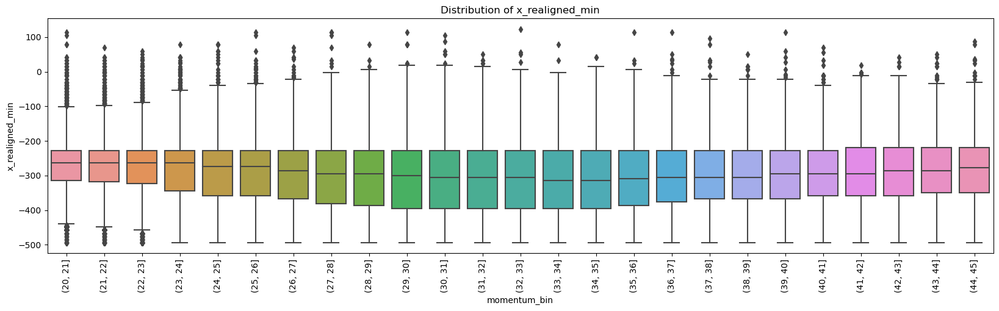

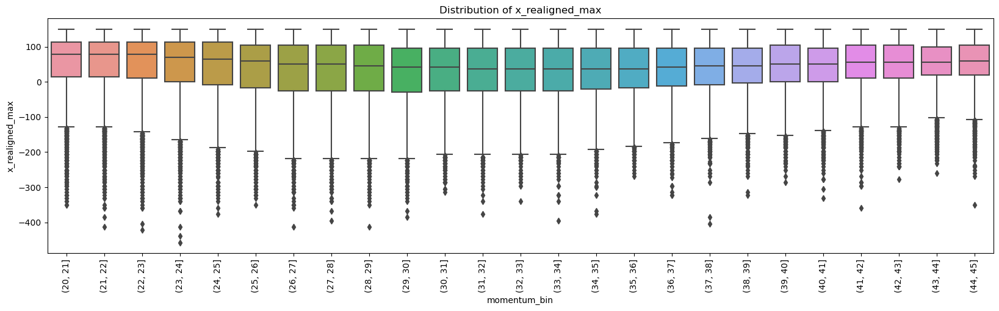

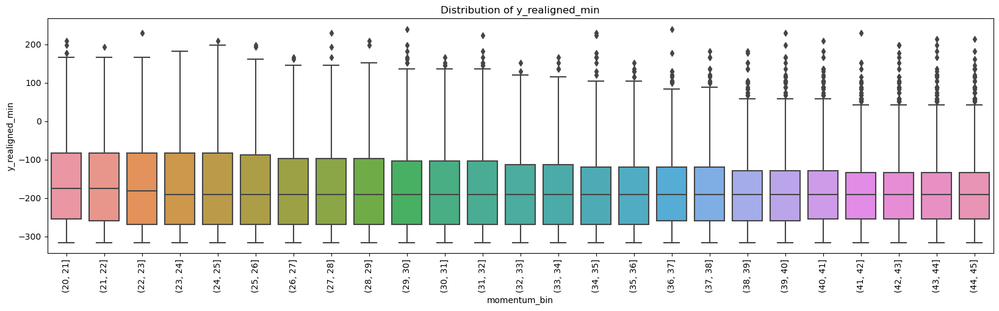

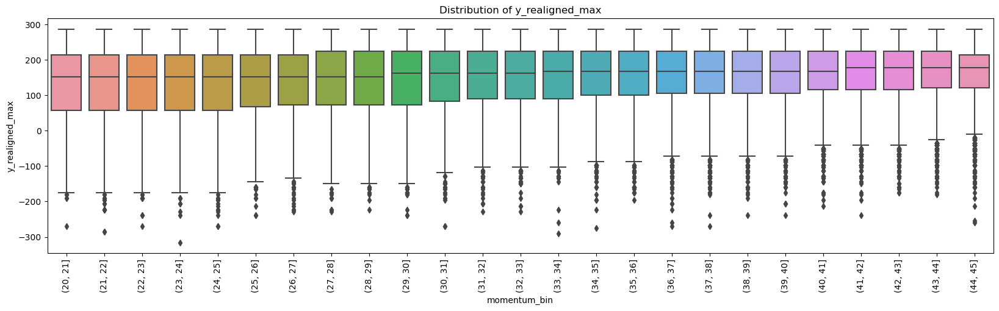

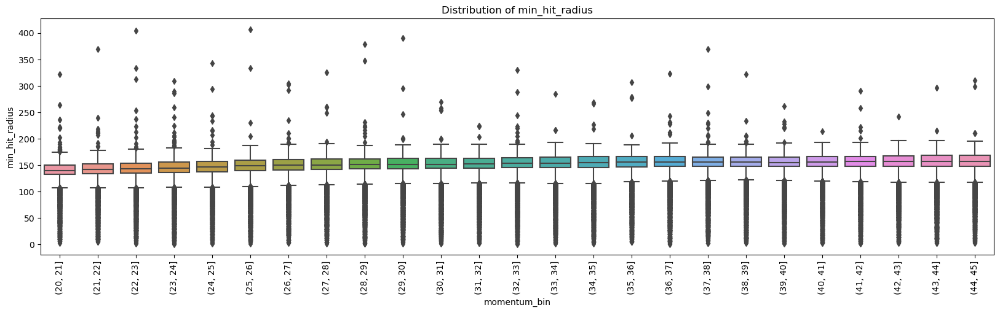

...

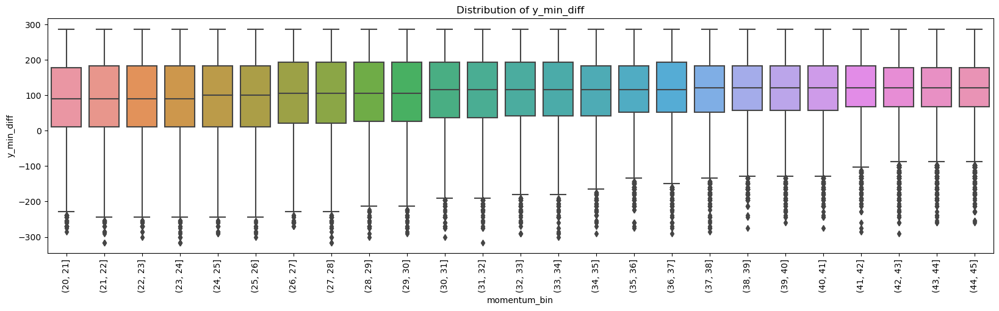

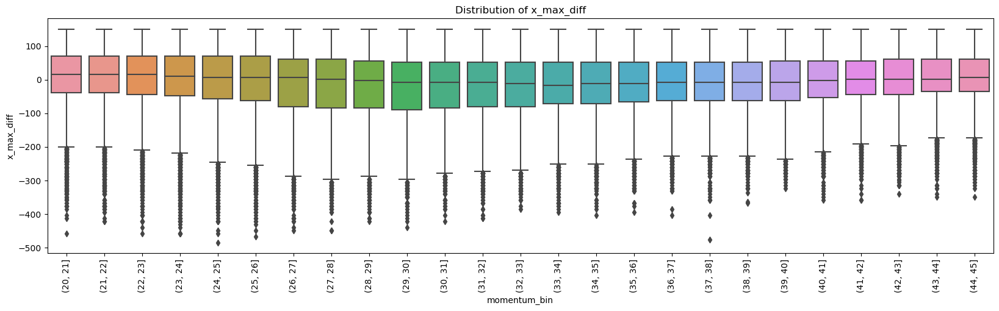

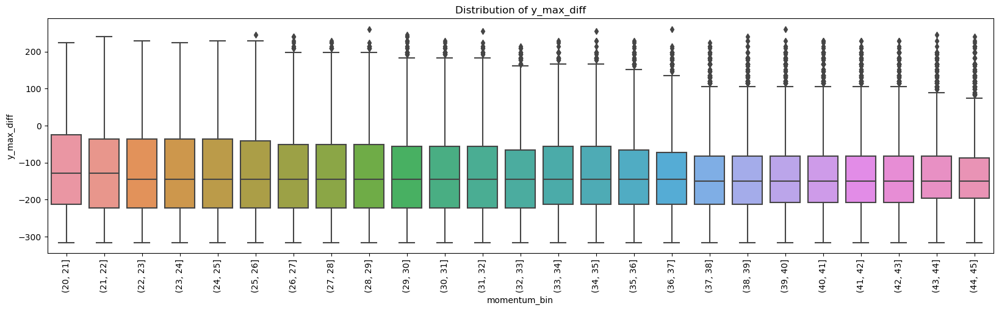

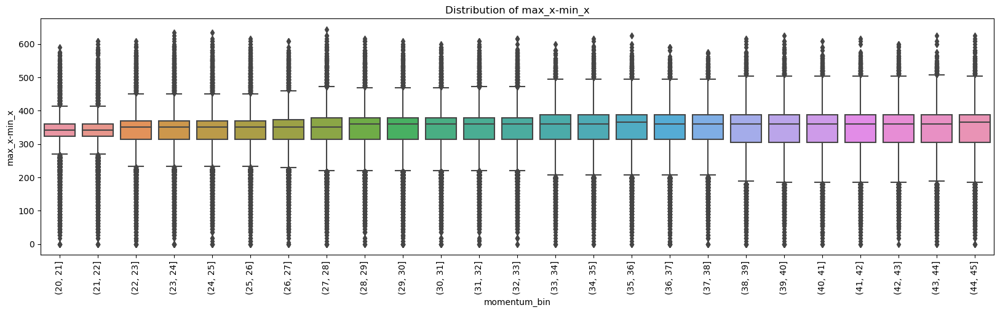

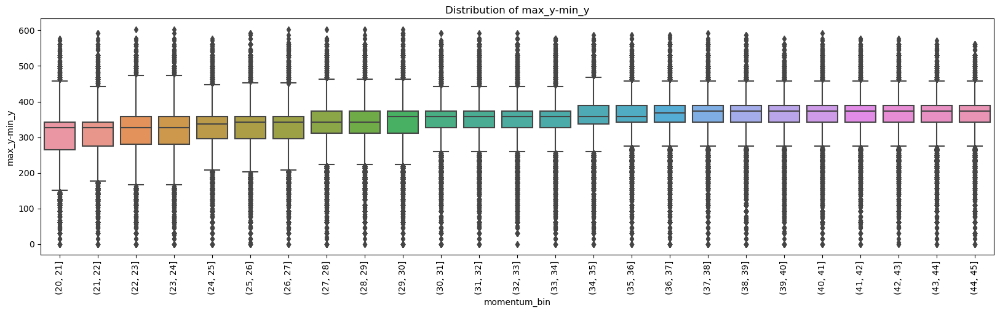

In [24]:
for i in range(1,20):
    sns.boxplot(data = grouped_hit_data, x = 'momentum_bin', y = grouped_hit_data.columns[i]).set(title = f'Distribution of {grouped_hit_data.columns[i]}')

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.xticks(rotation = 90)
    plt.show()


### 3.2 Boxplots of each feature vs. calculated radius bins 

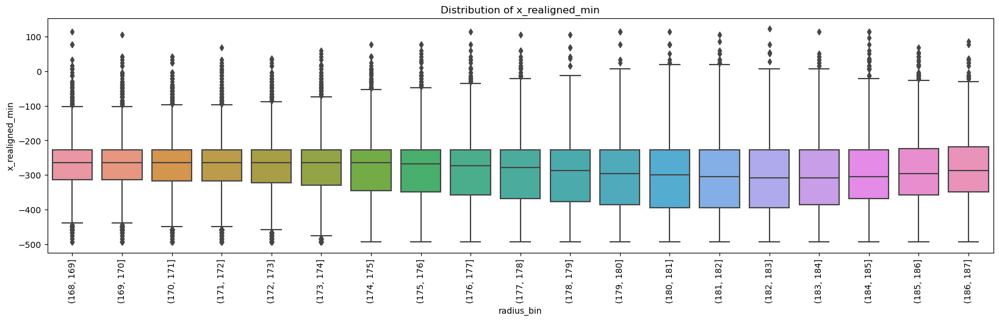

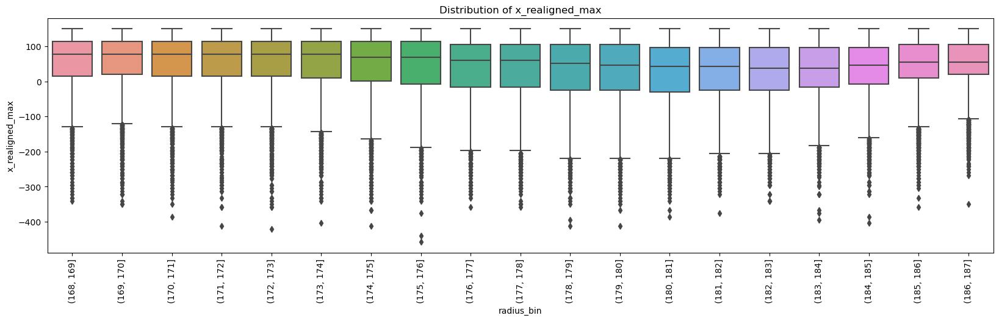

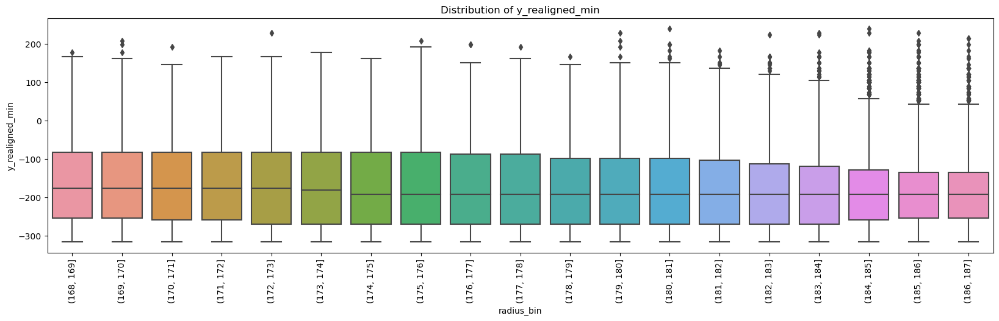

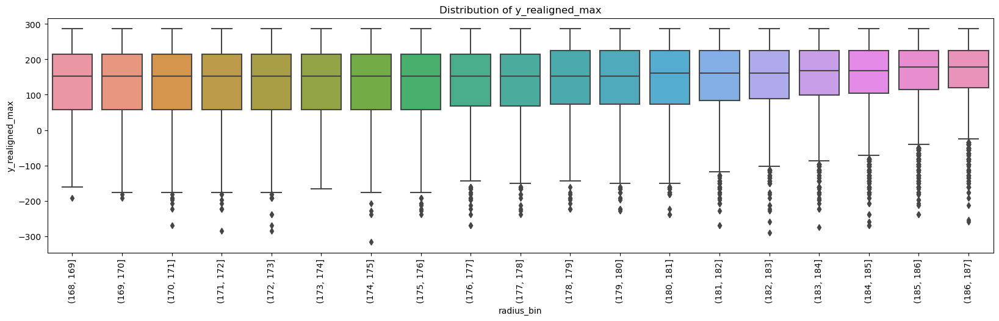

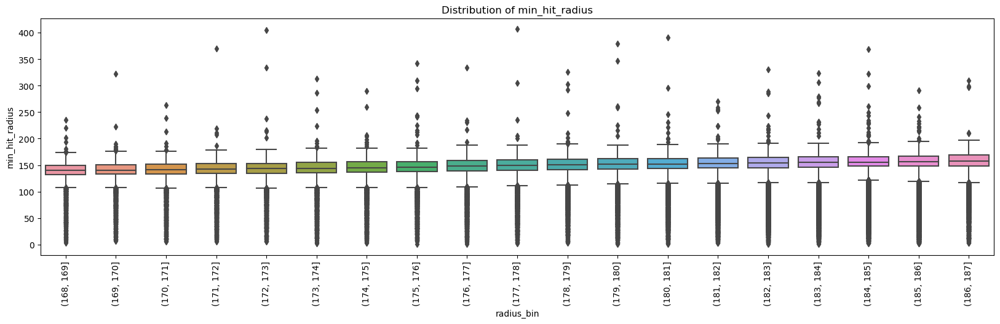

...

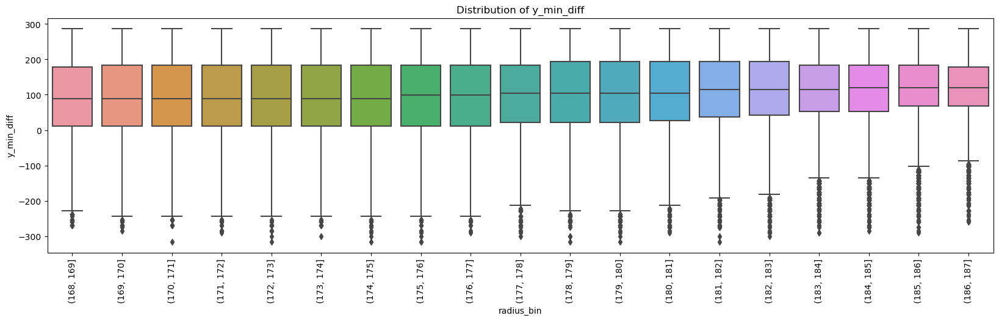

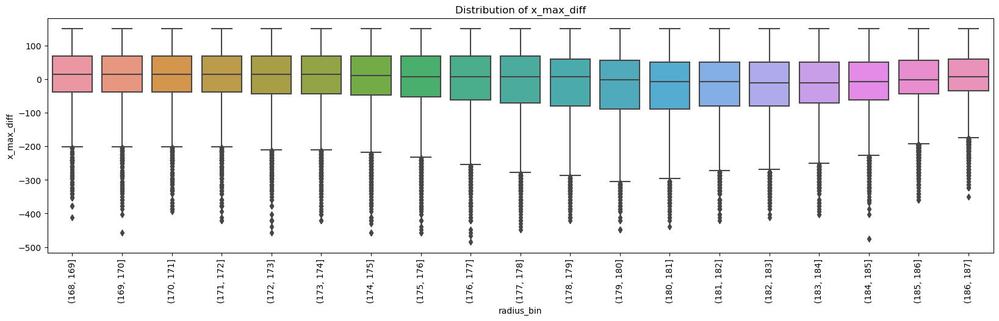

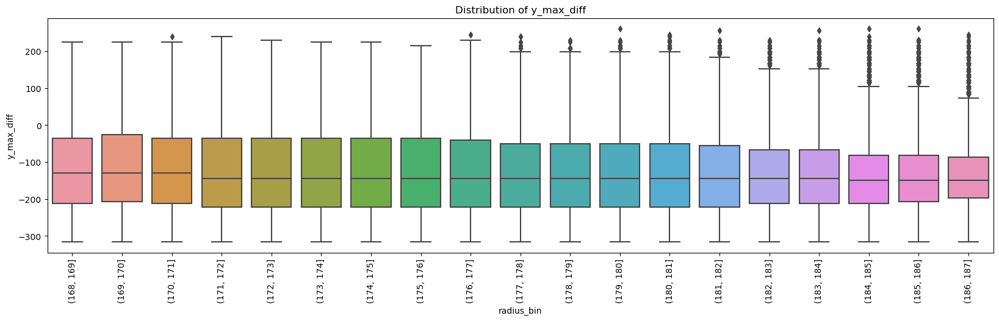

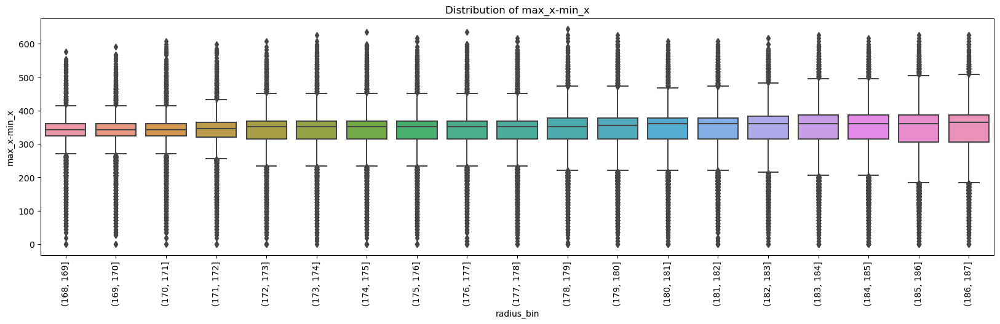

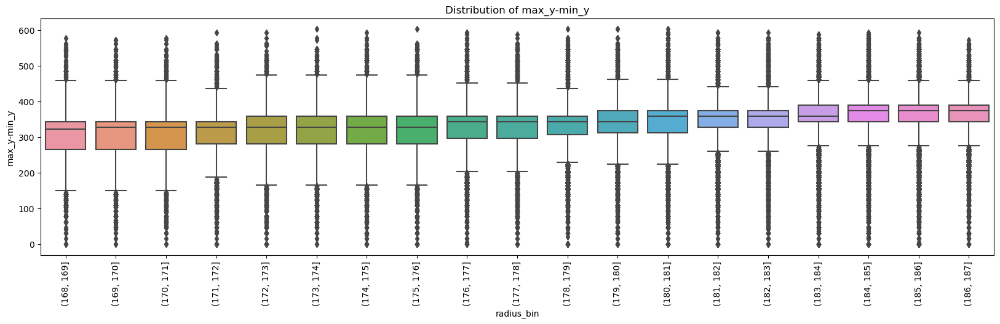

In [25]:
for i in range(1,20):
    sns.boxplot(data = grouped_hit_data, x = 'radius_bin', y = grouped_hit_data.columns[i]).set(title = f'Distribution of {grouped_hit_data.columns[i]}')

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.xticks(rotation = 90)
    plt.show()

#### Slice the data with momentum range from 20 to 25 GeV/c

In [26]:
grouped_hit_data_slice = grouped_hit_data.query('track_momentum >= 20 & track_momentum <= 25')

In [27]:
bins_slice = np.arange(168, 178, 1)
grouped_hit_data_slice['radius_bin_slice'] = pd.cut(grouped_hit_data_slice['ring_radius_cal'], bins=bins_slice)

/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_98867/3206556281.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped_hit_data_slice['radius_bin_slice'] = pd.cut(grouped_hit_data_slice['ring_radius_cal'], bins=bins_slice)


### 3.3 Histograms showing distribution of each feature, faceted by radius bins using data sliced for momentum in range 20-25 GeV/c

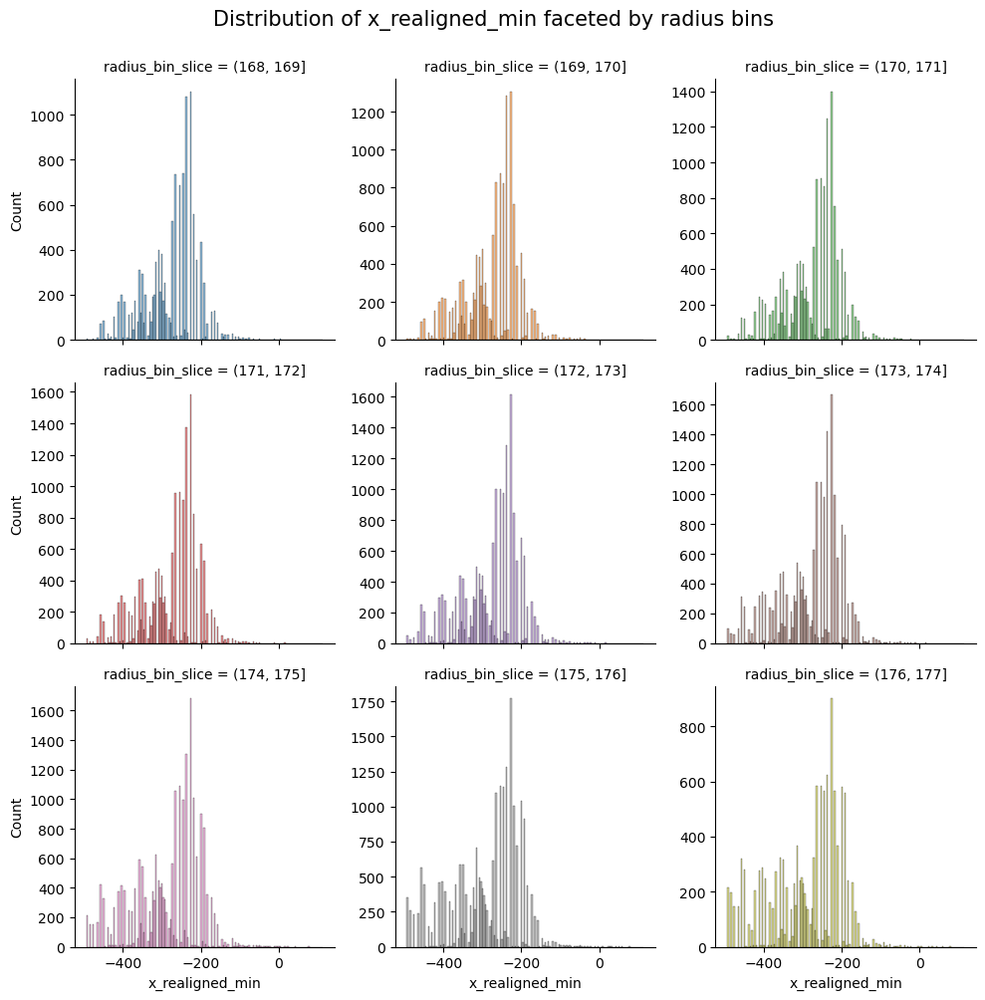

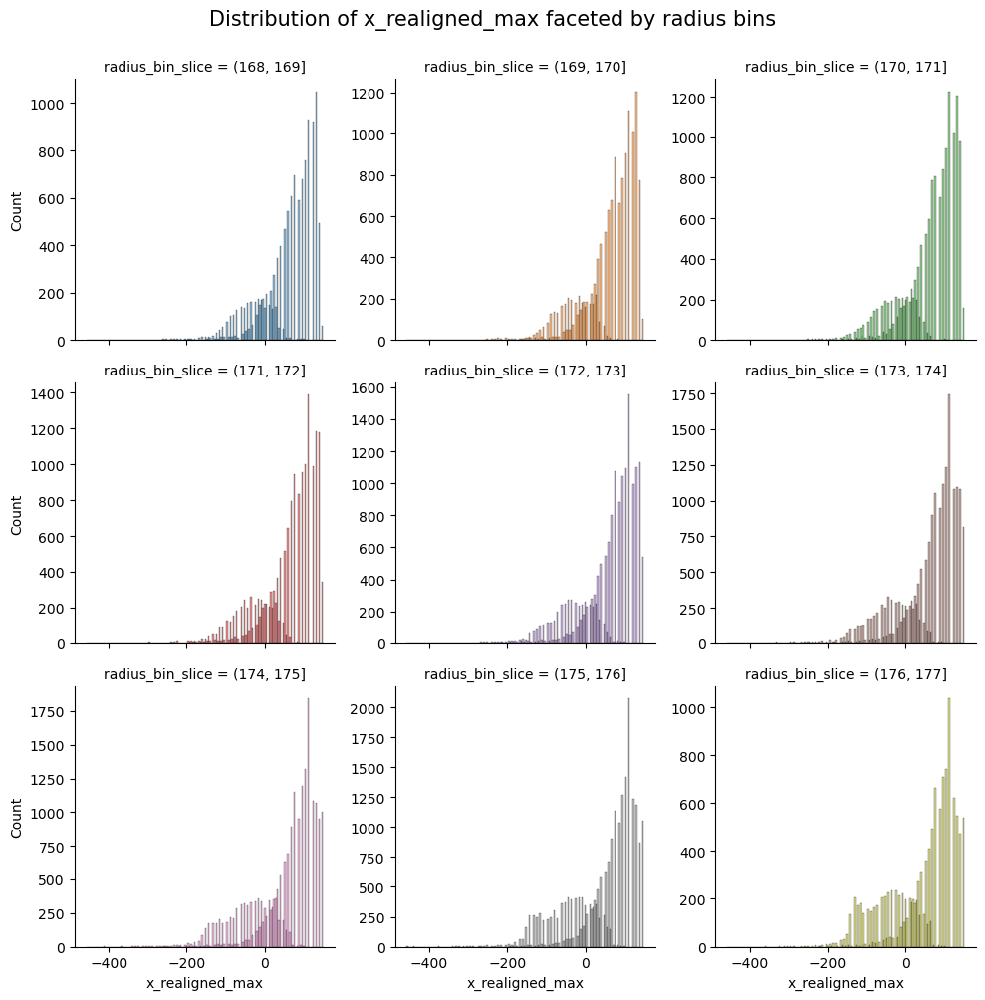

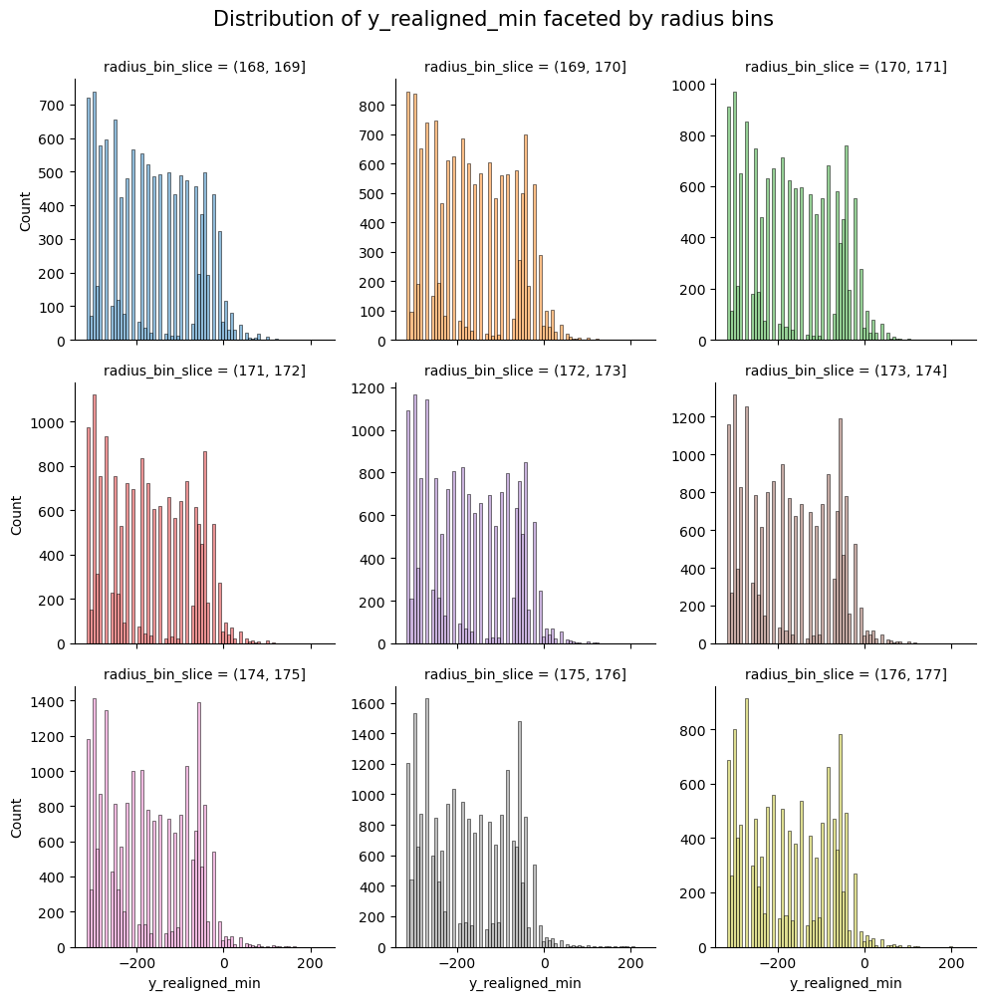

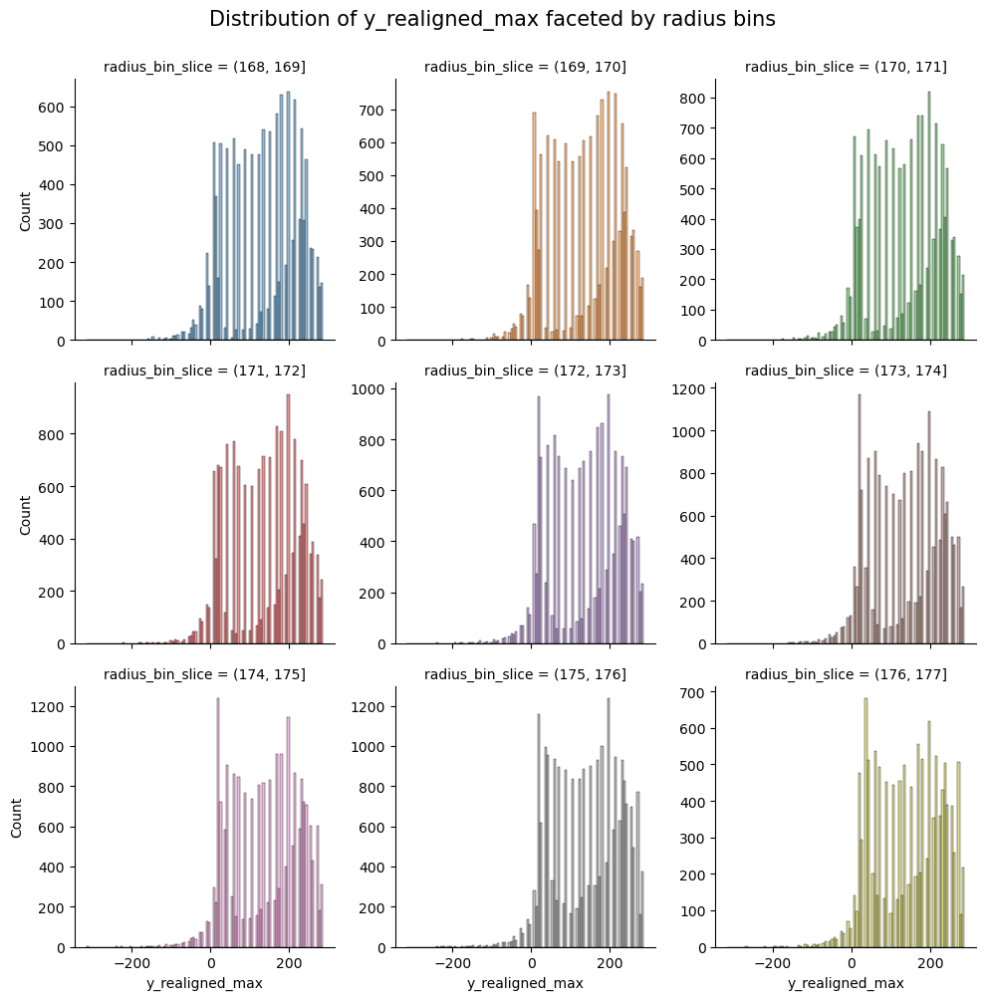

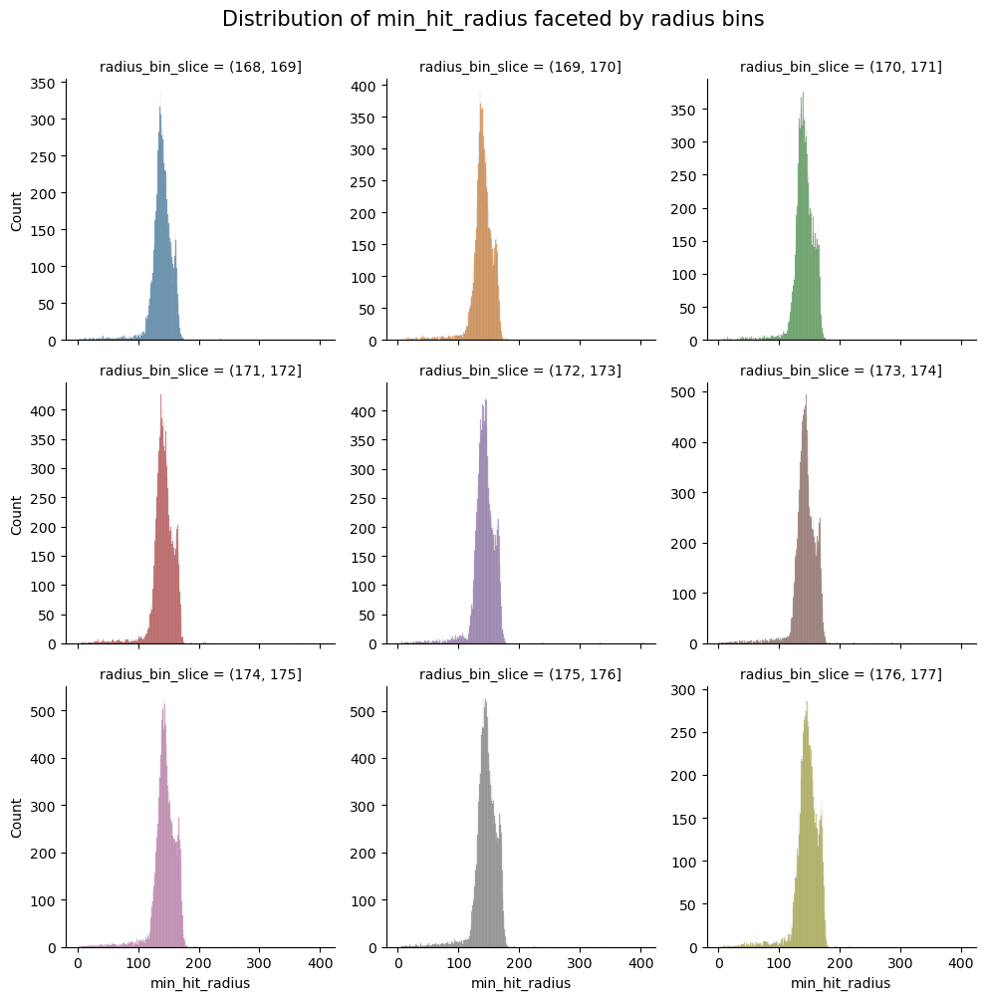

...

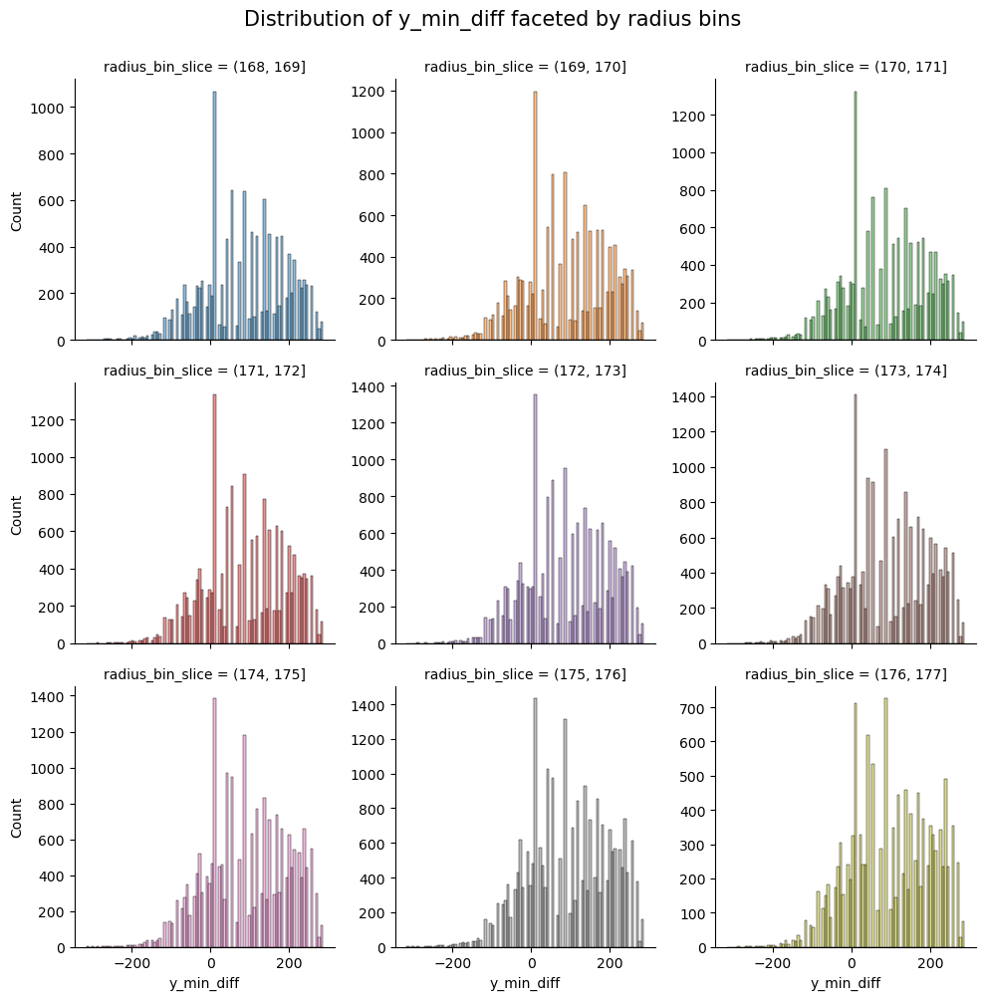

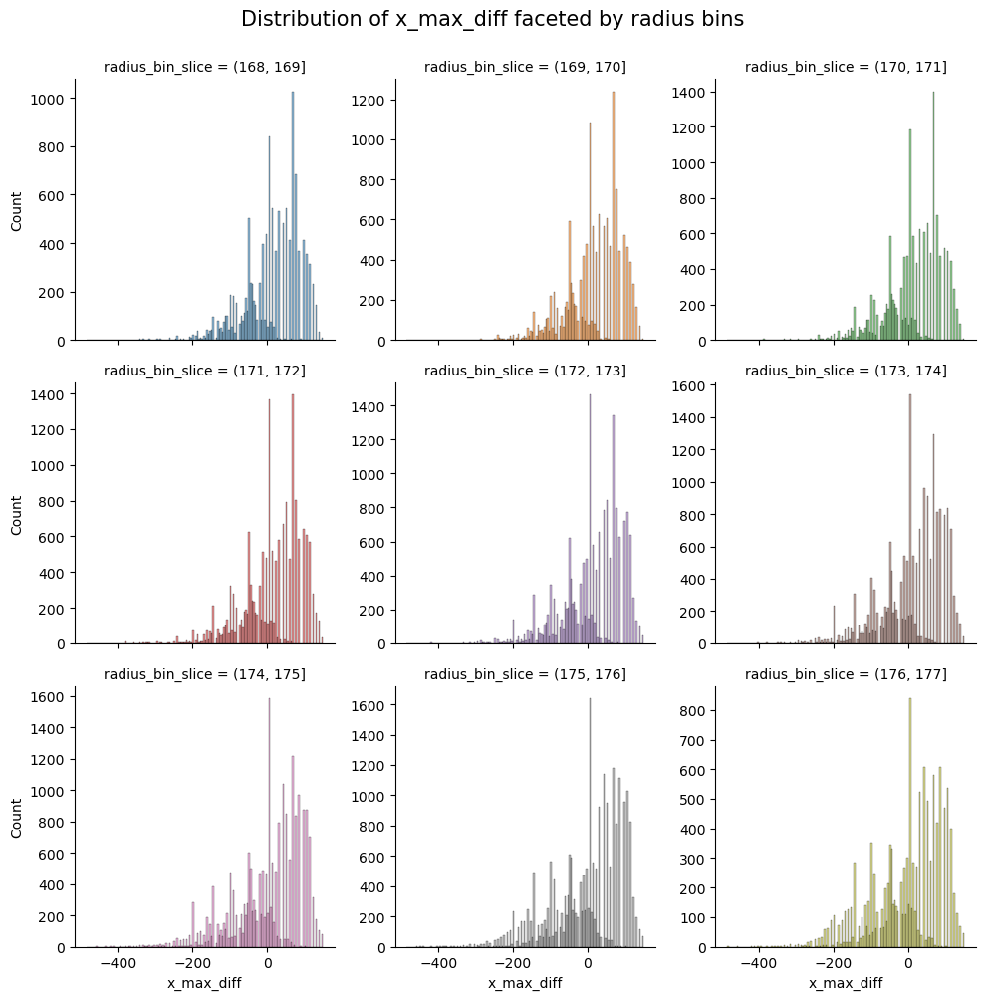

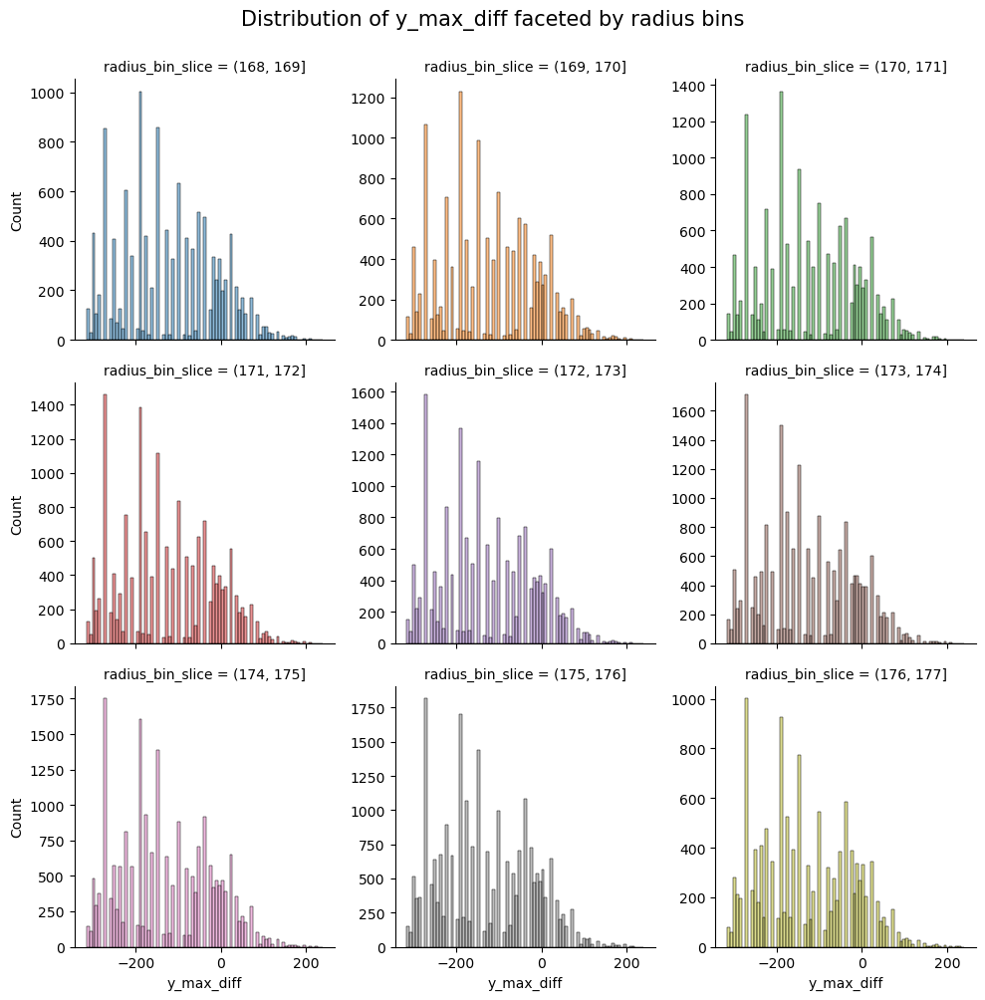

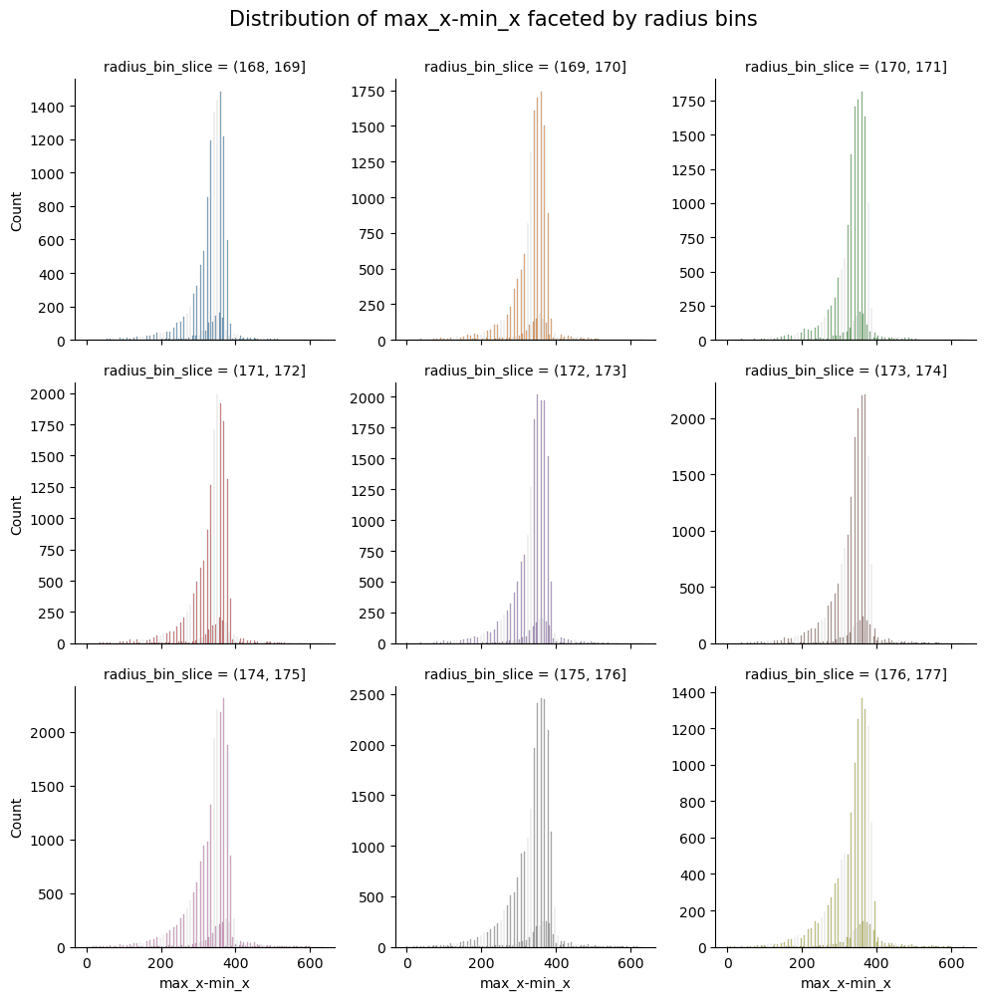

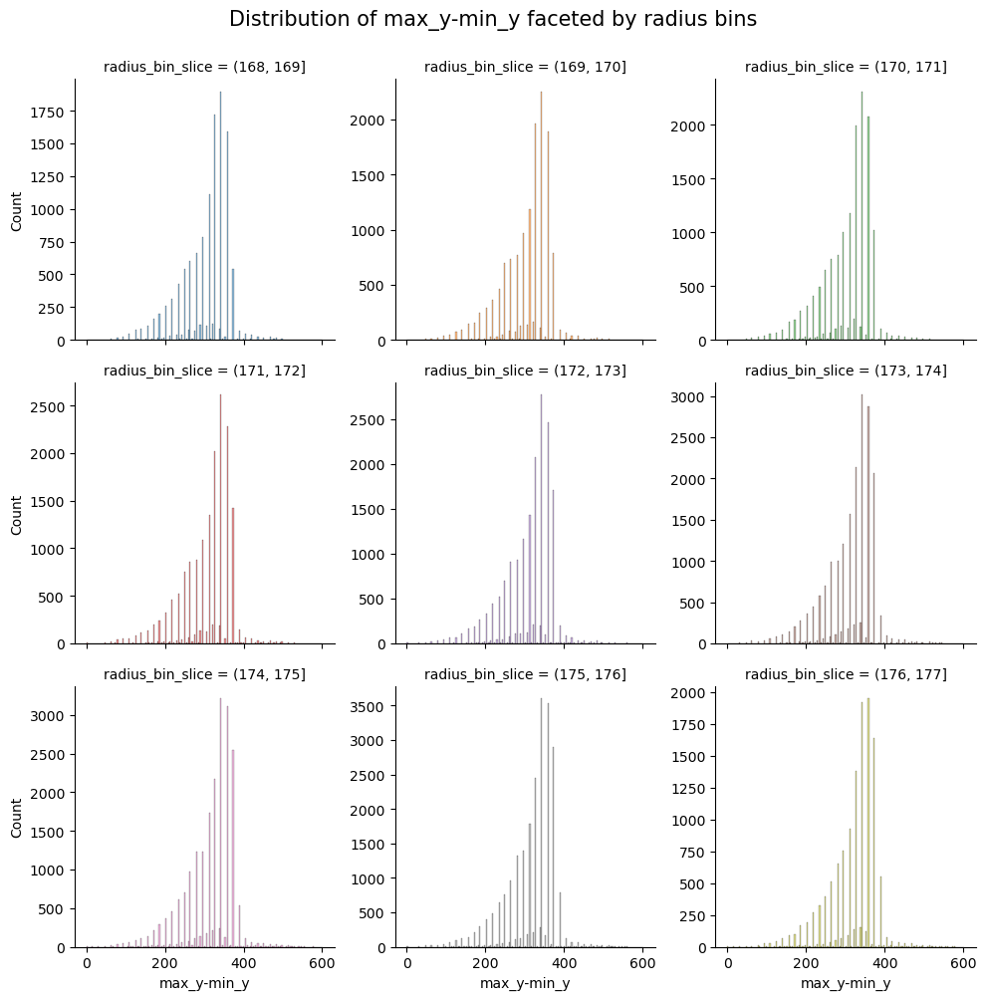

In [28]:
for i in range(1, 20):

    g = sns.displot(
        data=grouped_hit_data_slice,
        x=grouped_hit_data_slice.columns[i],
        hue="radius_bin_slice",
        col='radius_bin_slice',
        col_wrap=3,
        facet_kws=dict(sharey=False),
        legend=False
)

    g.fig.suptitle(f"Distribution of {grouped_hit_data_slice.columns[i]} faceted by radius bins", y=1, fontsize=15)
    g.set_titles(size=10)
    g.set_ylabels(fontsize=10)
    g.fig.set_figheight(10)
    g.fig.set_figwidth(10)

    
    plt.tight_layout()
    plt.show()

### 3.4 Scatter plot showing calculated ring radius vs. all the features with data sliced for momentum in range 20-25 GeV/c

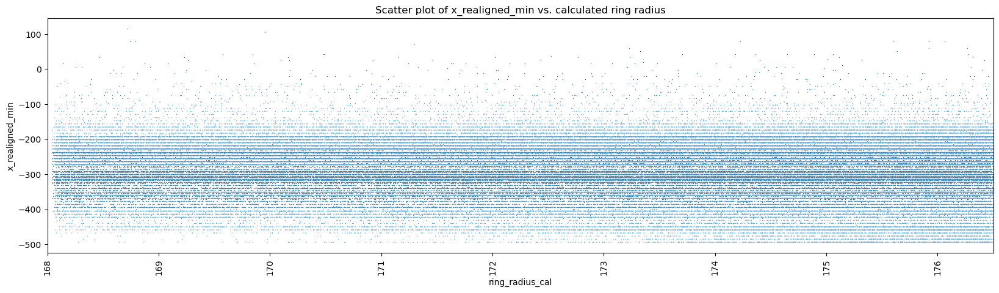

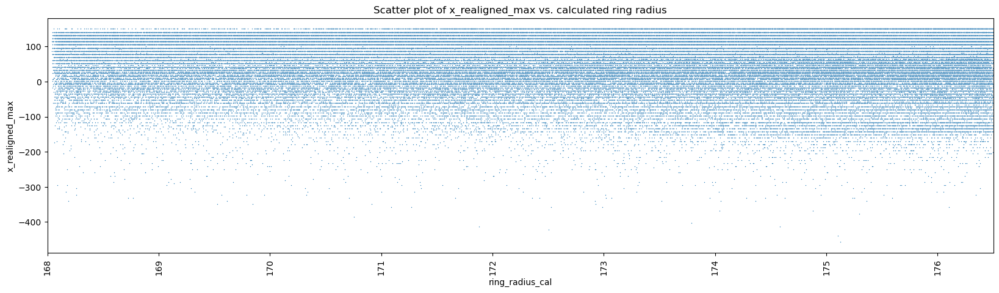

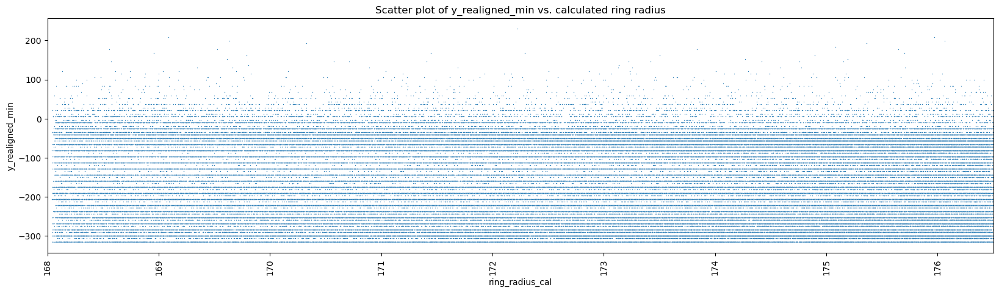

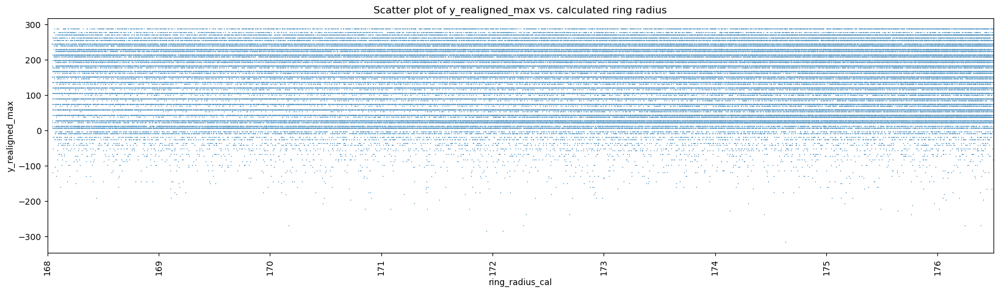

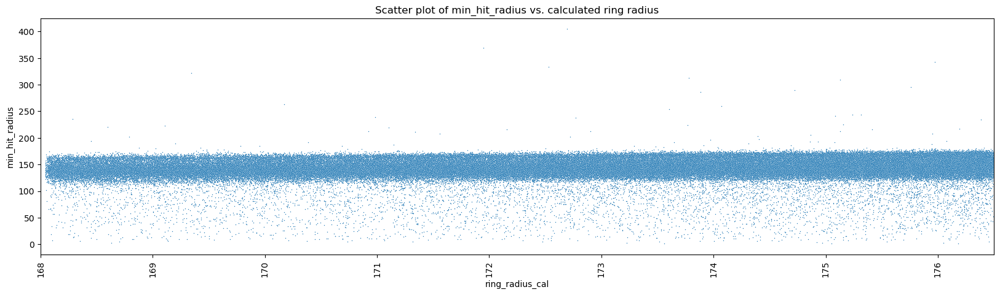

...

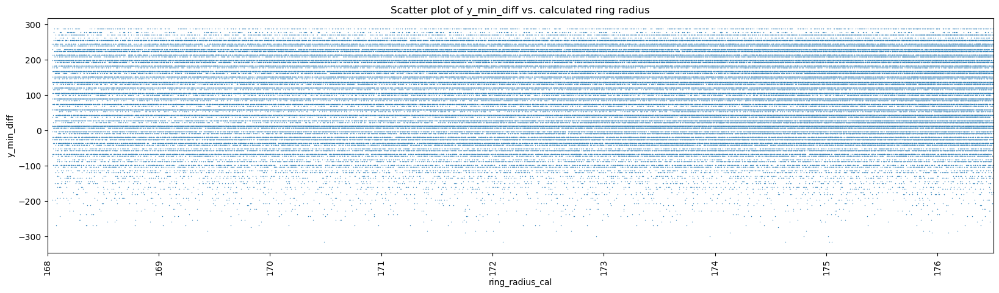

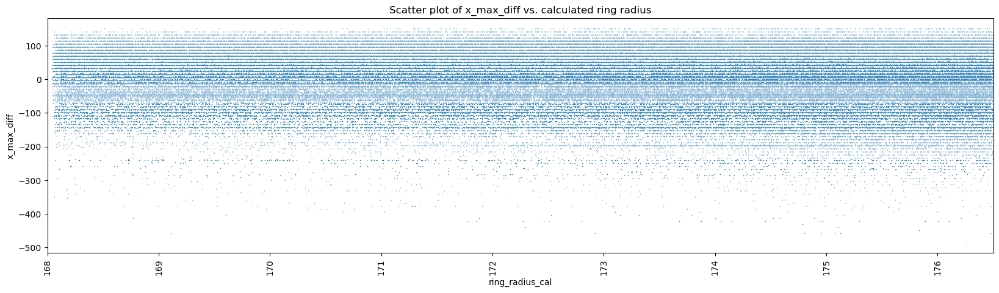

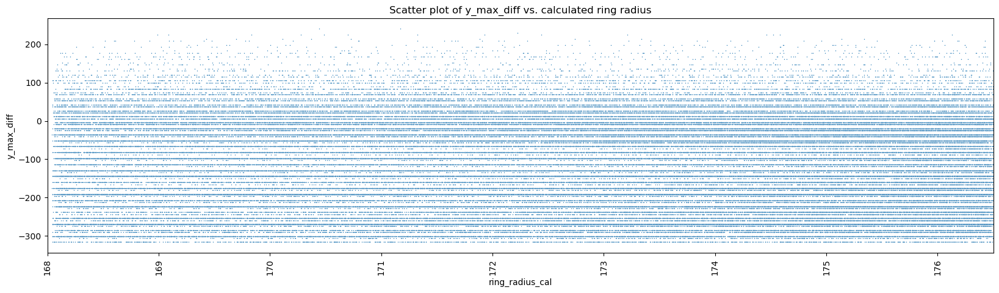

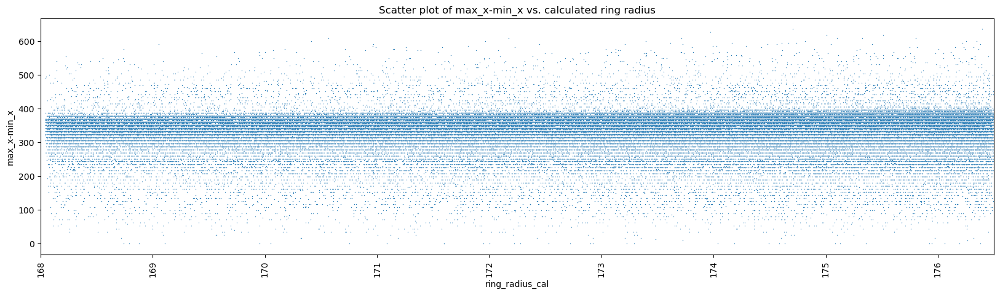

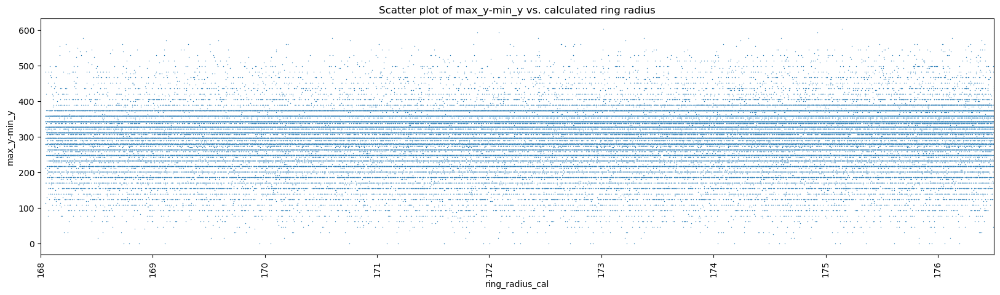

In [29]:
for i in range(1,20):
    g = sns.scatterplot(data = grouped_hit_data_slice, x = 'ring_radius_cal', y = grouped_hit_data.columns[i], s=1)
    g.set(xlim = (168, 176.5))

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.title(f'Scatter plot of {grouped_hit_data.columns[i]} vs. calculated ring radius')
    plt.xticks(rotation = 90)
    plt.show()


### 3.5 2D histograms showing calculated ring radius vs. all the features with data sliced for momentum in range 20-25 GeV/c

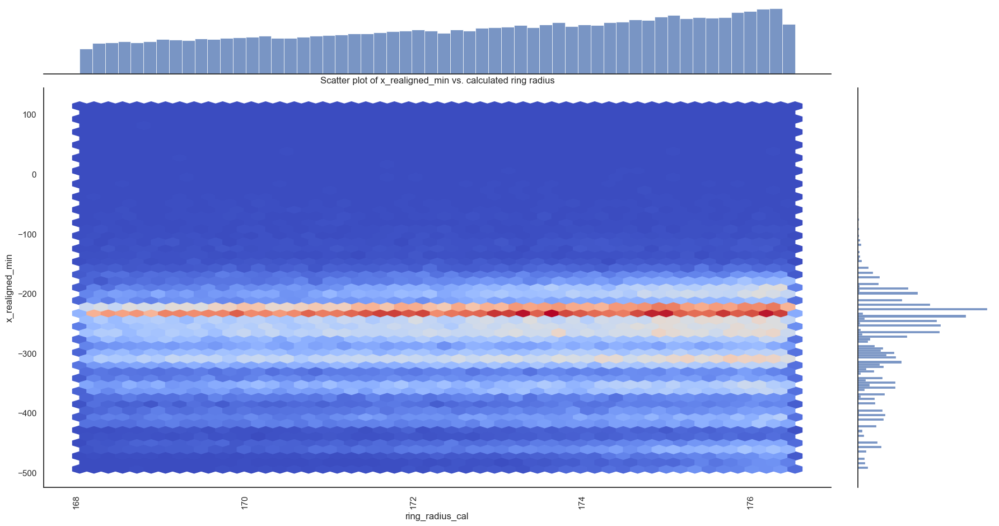

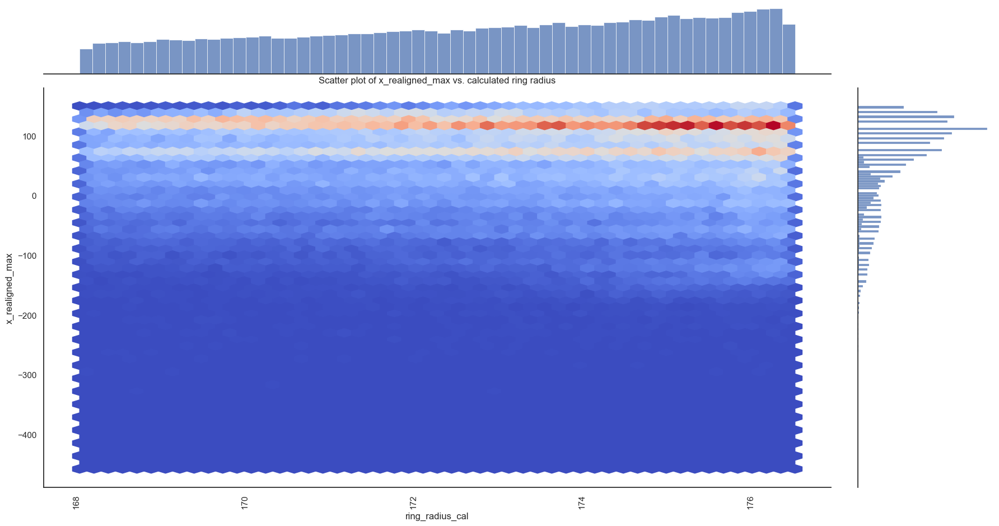

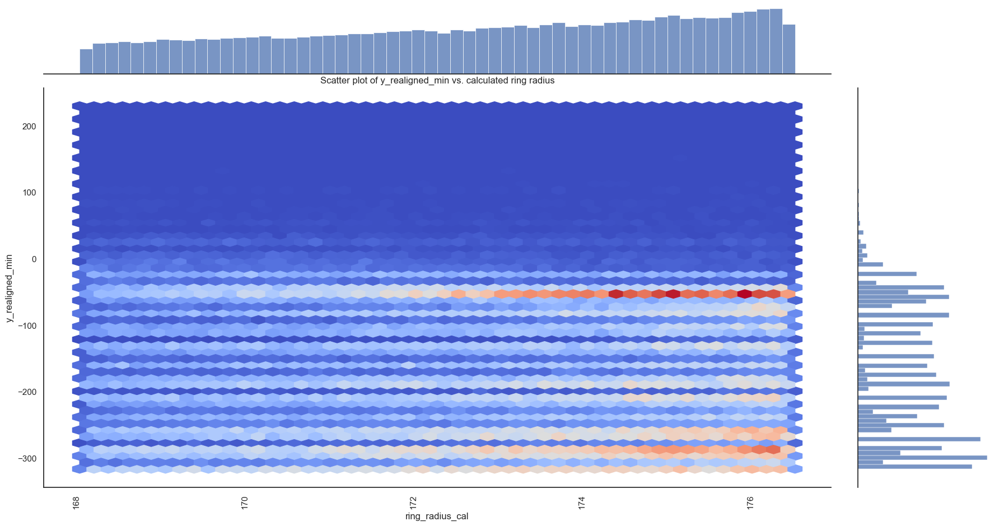

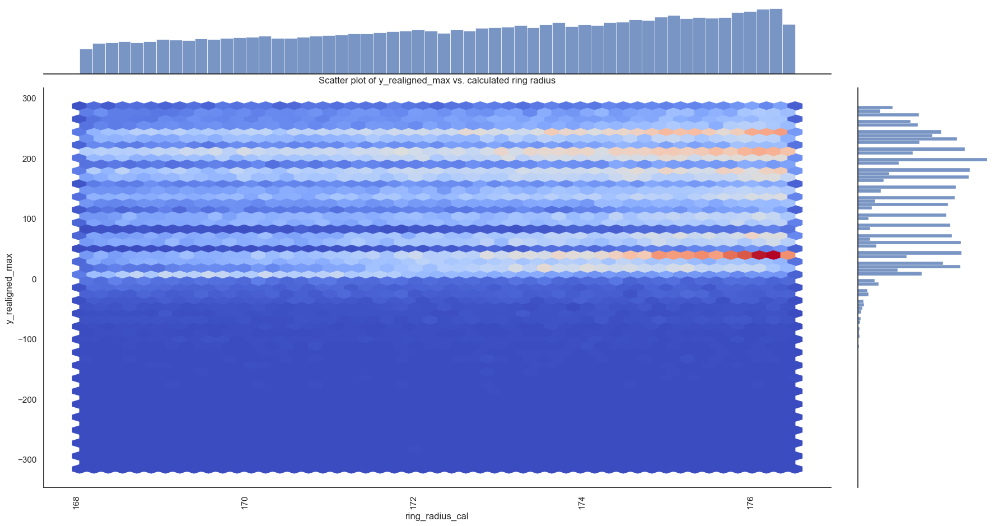

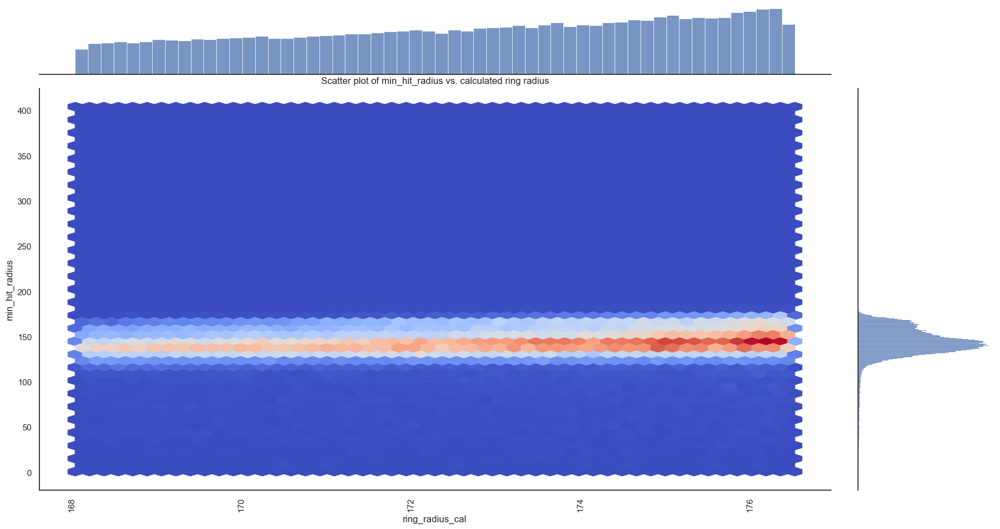

...

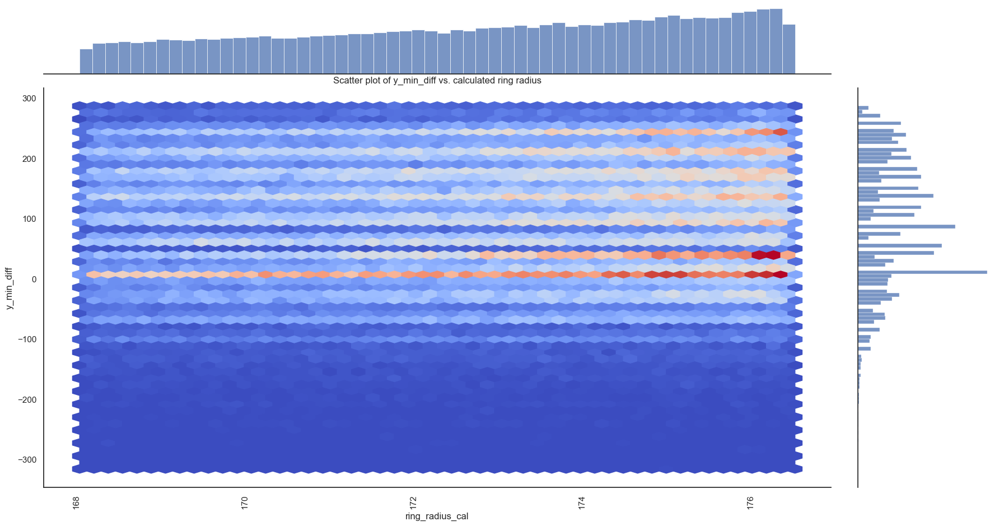

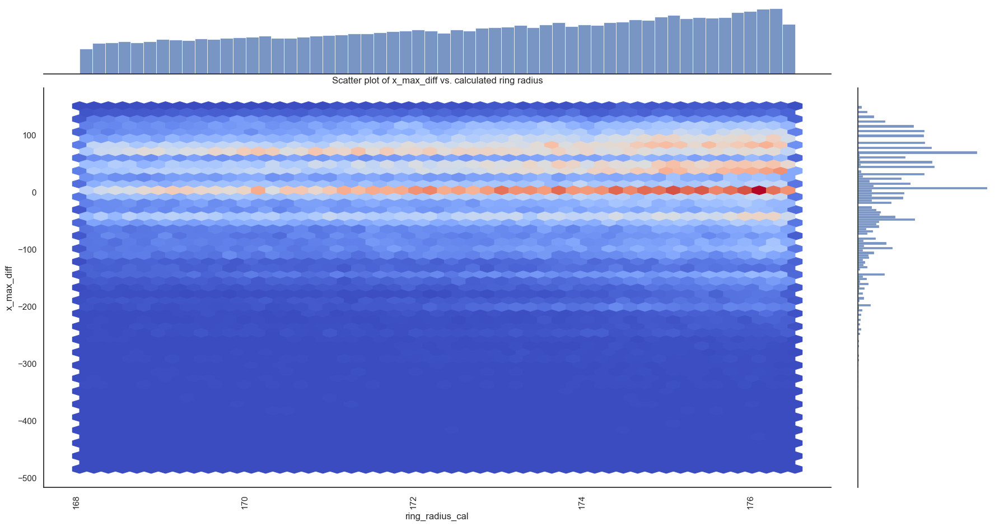

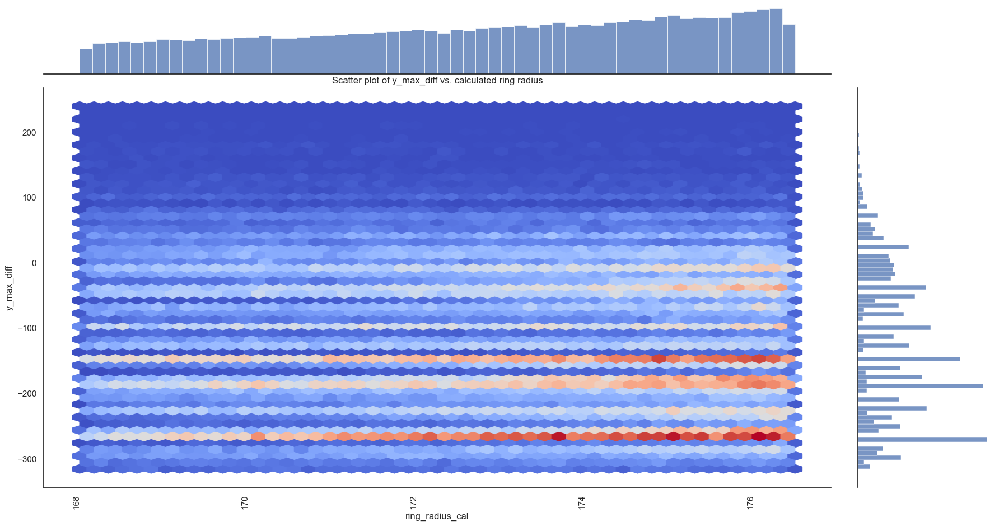

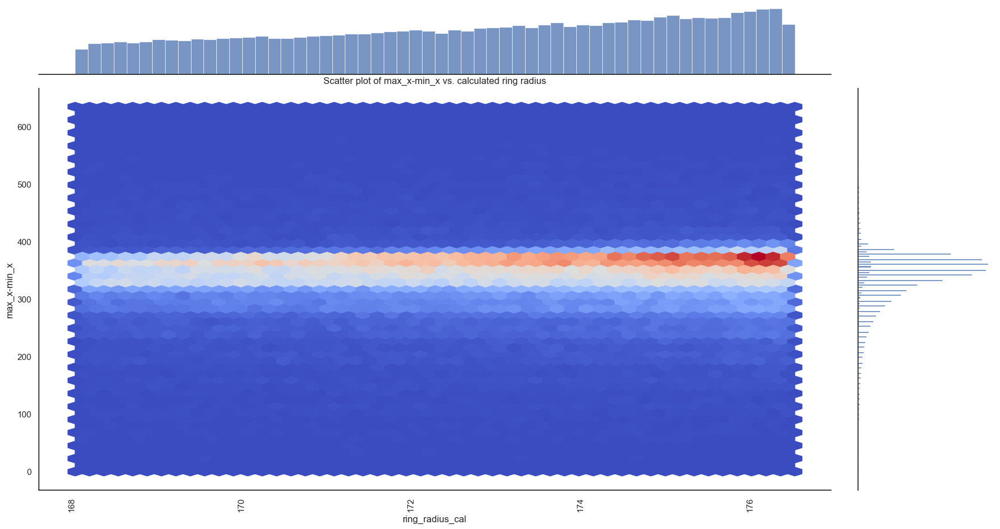

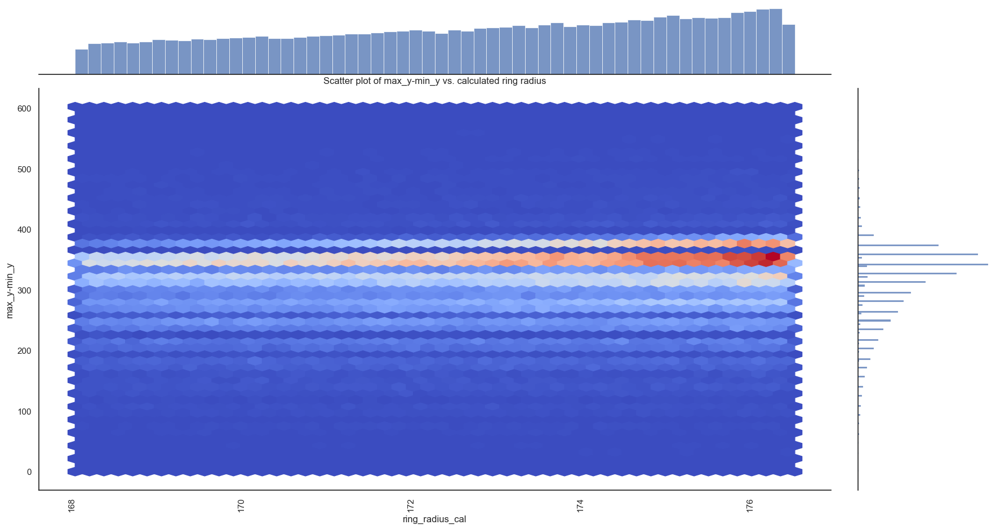

In [139]:
for i in range(1,20):
    g = sns.jointplot(data=grouped_hit_data_slice, x = 'ring_radius_cal', y = grouped_hit_data.columns[i], kind='hex', cmap='coolwarm')
    # g.set(xlim = (168, 176.5))

    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    plt.title(f'Scatter plot of {grouped_hit_data.columns[i]} vs. calculated ring radius')
    plt.xticks(rotation = 90)
    plt.show()


## 4. Training 

### 4.1 Testing the model with default hyperparameters 

#### Train test split 

In [31]:
train_df, test_df = train_test_split(grouped_hit_data, random_state=42)

In [32]:
X_train = train_df.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_train = train_df['ring_radius_cal']
X_test = test_df.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_test = test_df['ring_radius_cal']

#### 4.1.1 Fitting the `XGBRegressor` model

In [33]:
xgb_reg = xgb.XGBRegressor()

In [34]:
reg_metrics = ['neg_root_mean_squared_error', 'r2']

In [35]:
from sklearn.model_selection import cross_val_score, cross_validate, RandomizedSearchCV

In [36]:
xgb_reg.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 4.1.2 Cross validate

In [37]:
xgb_cv = cross_validate(xgb_reg, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [38]:
pd.DataFrame(xgb_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,13.439183,0.035825,-1.683956,-1.619986,0.877561,0.887407
1,13.124788,0.038317,-1.675722,-1.623250,0.878550,0.886999
2,13.126655,0.032111,-1.679305,-1.616046,0.879591,0.887639
3,13.276067,0.032282,-1.690468,-1.618031,0.877860,0.887392
4,13.719170,0.037013,-1.690711,-1.611048,0.877280,0.888487


#### 4.1.3 Predict and score on the test set

In [39]:
from sklearn.metrics import r2_score

In [41]:
ypred = xgb_reg.predict(X_test)
r2 = r2_score(y_test, ypred)
r2

0.8770821742146266

In [42]:
pred_df = pd.DataFrame(ypred, y_test).reset_index()
pred_df.columns=['predicted_radius', 'theoretical_radius']

In [43]:
pred_df

,predicted_radius,theoretical_radius
0,183.571647,183.935150
1,178.400346,177.664734
2,172.881030,173.159058
3,177.422429,177.468369
4,183.052409,182.884323
...,...,...
196466,174.740016,175.945984
196467,185.846299,185.504837
196468,185.066107,184.385696
196469,185.483867,184.715286


#### 4.1.4 Plotting feature importance 

In [44]:
pd.DataFrame({'features': xgb_reg.feature_names_in_, 'importance': xgb_reg.feature_importances_}).sort_values(by='importance', ascending=False)

,features,importance
7,median_hit_radius,0.757937
0,x_realigned_min,0.025047
2,y_realigned_min,0.022018
3,y_realigned_max,0.020781
1,x_realigned_max,0.018309
10,y_min_sum,0.015554
18,max_y-min_y,0.015366
9,x_min_sum,0.014479
16,y_max_diff,0.013339
8,rms_hit_radius,0.013075


#### 4.1.5 Computing the residuals

In [45]:
pred_df['residual'] = pred_df['theoretical_radius'] - pred_df['predicted_radius']

Text(0, 0.5, 'Residuals')

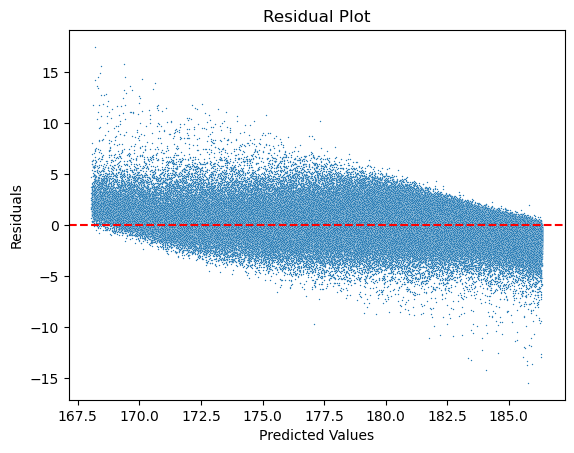

In [46]:
sns.scatterplot(data=pred_df, x='predicted_radius', y='residual', s=1)

plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

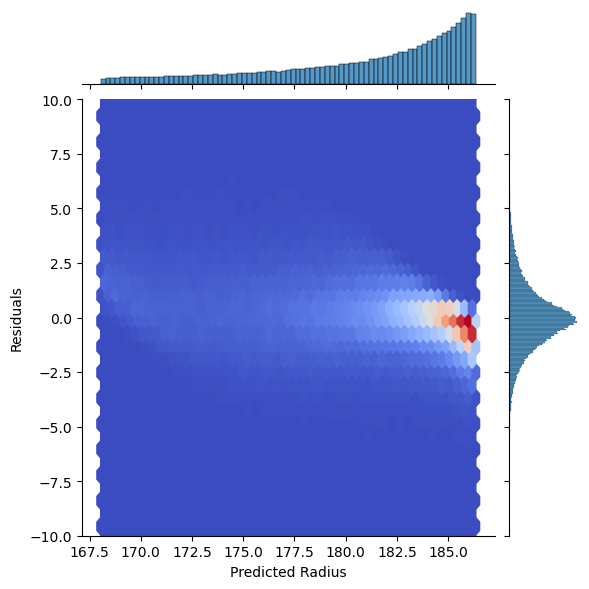

In [47]:
g = sns.jointplot(data=pred_df, x='predicted_radius', y='residual', kind='hex', cmap='coolwarm', ylim = (-10, 10))

plt.xlabel('Predicted Radius')
plt.ylabel('Residuals')

### 4.2 Hyperparameter optimization 

#### Subsetting a smaller sample for hyperparameter optimization

In [48]:
samples_per_bin = 3000

sampled_group = grouped_hit_data.groupby('momentum_bin').apply(lambda x: x.sample(samples_per_bin, random_state=42)).reset_index(drop=True)

sampled_group.reset_index(drop=True, inplace=True)


In [49]:
train_df_subset, test_df_subset = train_test_split(sampled_group, random_state=42)

In [50]:
X_train_subset = train_df_subset.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_train_subset = train_df_subset['ring_radius_cal']
X_test_subset = test_df_subset.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_test_subset = test_df_subset['ring_radius_cal']

#### Hyperparameters included:
- `max_depth`: the maximum depth of trees 
- `learning_rate`: the rate at which each new tree modifies the overall model
- `reg_lambda`: the degree of L2 regularization
- `reg_alpha`: the degree of L1 regularization 
- `n_estimators`: number of trees included in the model 

In [51]:
# param_grid = {
#     "max_depth": [4, 6, 8, 10],
#     "learning_rate": [0.001, 0.01, 0.05, 0.1, 0.3, 0.5, 0.7],
#     "reg_lambda": [0, 0.1, 0.3, 0.5, 0.7, 0.9],
#     "reg_alpha": [0, 0.1, 0.3, 0.5, 0.7, 0.9],
#     "n_estimators": [100, 300, 500, 700, 900]
# }

# xgb_tune = XGBRegressor()

# random_search = RandomizedSearchCV(
#     estimator=xgb_tune,
#     param_distributions=param_grid,
#     scoring="r2",
#     n_iter=20,
#     cv=5,
#     random_state=42
# )

# random_search.fit(X_train_subset, y_train_subset)

In [52]:
# best_params = random_search.best_params_
# best_score = random_search.best_score_

In [53]:
# best_params

In [54]:
# best_score

#### 4.2.1 Showing cv scores on the optimized hyperparameters

In [55]:
xgb_opt = xgb.XGBRegressor(reg_lambda= 0.5,reg_alpha= 0.5, n_estimators= 500, max_depth= 6, learning_rate= 0.1)

In [56]:
xgb_opt_cv = cross_validate(xgb_opt, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [57]:
pd.DataFrame(xgb_opt_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,66.680747,0.139882,-1.612324,-1.516049,0.887756,0.901391
1,68.760386,0.151623,-1.608279,-1.520202,0.888129,0.900890
2,66.957651,0.132815,-1.615103,-1.518715,0.888622,0.900766
3,70.980181,0.158277,-1.627534,-1.519396,0.886785,0.900703
4,70.522119,0.141830,-1.630366,-1.518398,0.885884,0.900944


#### 4.2.2 Fitting the model with the optimized hyperparameters 

In [58]:
xgb_opt.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 4.2.3 Plotting feature importance

In [59]:
importance = pd.DataFrame({'features': xgb_opt.feature_names_in_, 'importance': xgb_opt.feature_importances_})

In [60]:
importance.sort_values(by='importance', ascending=False)

,features,importance
7,median_hit_radius,0.762774
2,y_realigned_min,0.027113
0,x_realigned_min,0.023500
3,y_realigned_max,0.019795
1,x_realigned_max,0.016359
10,y_min_sum,0.015281
9,x_min_sum,0.015165
15,x_max_diff,0.013641
16,y_max_diff,0.012807
13,x_min_diff,0.012153


#### 4.2.4 Computing the residuals 

In [61]:
ypred_opt = xgb_opt.predict(X_test)

In [62]:
pred_opt_df = pd.DataFrame(ypred_opt, y_test).reset_index()
pred_opt_df.columns=['predicted_radius', 'theoretical_radius']
pred_opt_df['residual'] = pred_opt_df['theoretical_radius'] - pred_opt_df['predicted_radius']

Text(0, 0.5, 'Residuals')

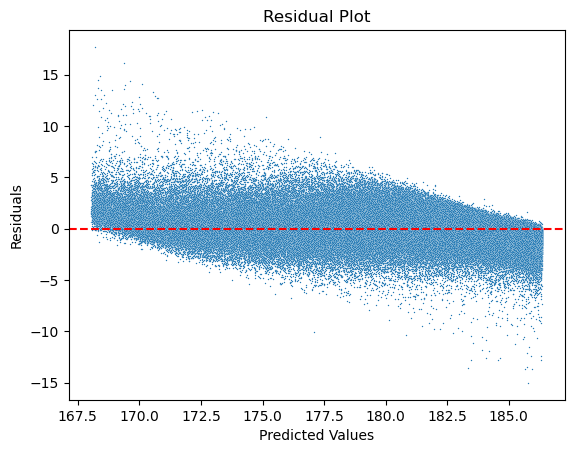

In [63]:
sns.scatterplot(data=pred_opt_df, x='predicted_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

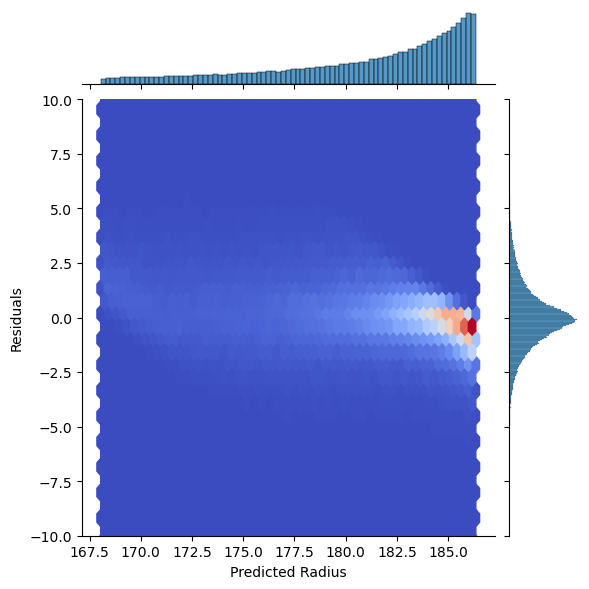

In [64]:
g = sns.jointplot(data=pred_opt_df, x='predicted_radius', y='residual', kind='hex', cmap='coolwarm', ylim = (-10, 10))

plt.xlabel('Predicted Radius')
plt.ylabel('Residuals')

### 4.3 Testing the model with `Dart Booster` 

In [65]:
xgb_dart = xgb.XGBRegressor(reg_lambda= 0.5,reg_alpha= 0.5, n_estimators= 500, max_depth= 6, learning_rate= 0.1, booster='dart')

In [66]:
xgb_dart.fit(X_train, y_train)

XGBRegressor(base_score=None, booster='dart', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [67]:
xgb_dart.score(X_test, y_test)

0.8866652511706778

In [68]:
ypred_dart = xgb_dart.predict(X_test)


In [69]:
pred_dart_df = pd.DataFrame(ypred_dart, y_test).reset_index()
pred_dart_df.columns=['predicted_radius', 'theoretical_radius']
pred_dart_df['residual'] = pred_dart_df['theoretical_radius'] - pred_dart_df['predicted_radius']

Text(0, 0.5, 'Residuals')

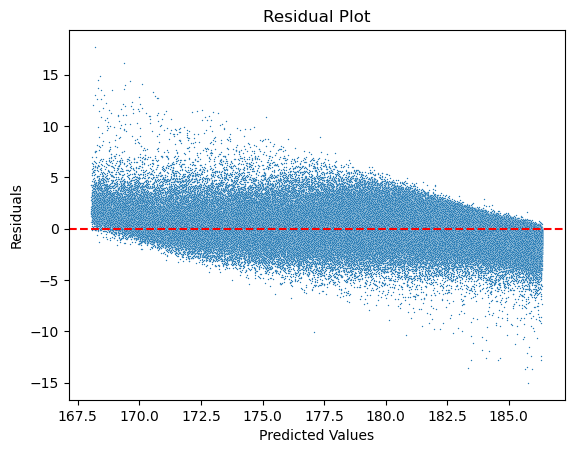

In [70]:
sns.scatterplot(data=pred_dart_df, x='predicted_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

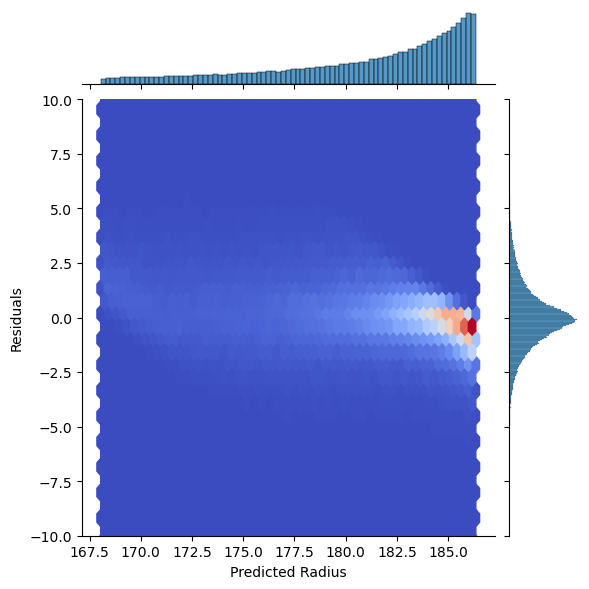

In [71]:
g = sns.jointplot(data=pred_dart_df, x='predicted_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Predicted Radius')
plt.ylabel('Residuals')

### 4.4 Transform the features using `PolynomialFeatures`

#### 4.4.1 Transforming the training data to a degree of 2 

In [72]:
from sklearn.preprocessing import PolynomialFeatures

deg = 2
poly_feats = PolynomialFeatures(degree=deg)
X_enc = poly_feats.fit_transform(X_train)
pd.DataFrame(X_enc, columns=poly_feats.get_feature_names_out()).head()

,1,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius,...,x_max_diff^2,x_max_diff y_max_diff,x_max_diff max_x-min_x,x_max_diff max_y-min_y,y_max_diff^2,y_max_diff max_x-min_x,y_max_diff max_y-min_y,max_x-min_x^2,max_x-min_x max_y-min_y,max_y-min_y^2
0,1.0,-227.8,87.2,-144.509999,198.440005,164.701538,218.965076,190.777502,186.964652,191.314297,...,6115.24,-11300.681928,24633.0,26818.690358,20883.139835,-45520.649712,-49559.704848,99225.0,108029.251442,117614.705640
1,1.0,-227.8,114.2,-284.800000,89.320003,121.542441,210.867780,167.952997,168.313035,168.937740,...,4788.64,-13235.884084,23666.4,25889.104190,36584.213367,-65414.340417,-71557.933382,116964.0,127949.040939,139965.776455
2,1.0,-448.7,-61.7,-258.919998,115.209999,127.056806,208.837159,182.837695,185.056739,183.651139,...,35231.29,48599.283656,-72639.9,-70224.200484,67039.565452,-100202.039291,-96869.738204,149769.0,144788.308937,139973.254845
3,1.0,-263.8,60.2,-113.329999,260.789996,161.092985,212.368207,187.599668,183.818580,188.125617,...,1780.84,-3466.729936,13672.8,15787.863794,6748.622249,-26616.599506,-30733.957028,104976.0,121214.878418,139965.770746
4,1.0,-340.7,-25.7,-118.620003,255.500000,142.615891,206.787569,180.717035,179.785970,181.193424,...,660.49,-2159.570969,-8095.5,-9614.884071,7061.040695,26469.449615,31437.303374,99225.0,117847.800865,139965.776455


#### 4.4.2 Fitting and scoring on the data using the same optimized hyperparameters 

In [73]:
xgb_opt.fit(X_enc, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [74]:
X_test_enc = poly_feats.transform(X_test)

In [75]:
xgb_opt.score(X_test_enc, y_test)

0.8892989705535624

#### 4.4.3 Computing the residuals 

In [76]:
ypred_poly = xgb_opt.predict(X_test_enc)

In [77]:
pred_poly_df = pd.DataFrame(ypred_poly, y_test).reset_index()
pred_poly_df.columns=['predicted_radius', 'theoretical_radius']
pred_poly_df['residual'] = pred_poly_df['theoretical_radius'] - pred_poly_df['predicted_radius']

Text(0, 0.5, 'Residuals')

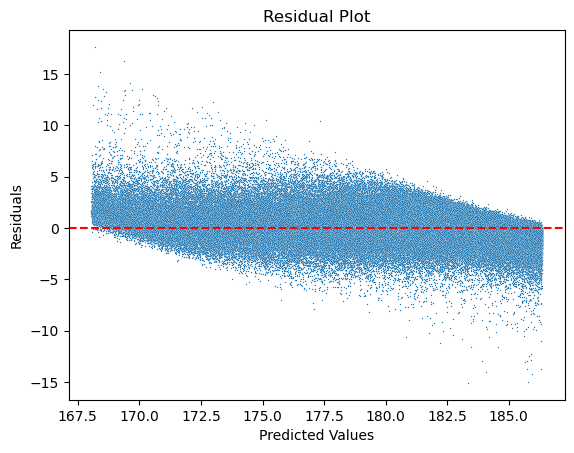

In [78]:
sns.scatterplot(data=pred_poly_df, x='predicted_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

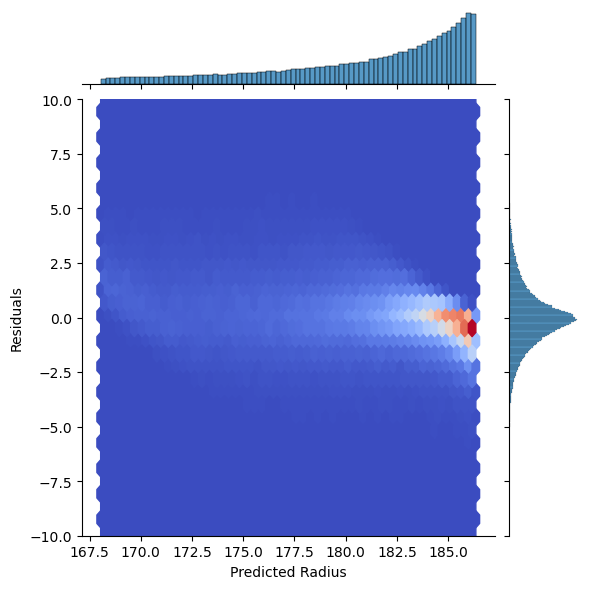

In [79]:
g = sns.jointplot(data=pred_poly_df, x='predicted_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Predicted Radius')
plt.ylabel('Residuals')

### 4.5 Testing the model on data subsetted on `median_hit_radius` only
- According to the feature importance output from 4.2.3, it can be seen that the feature importance for `median_hit_radius` is 0.76, which accounts for majority of the importance among all features. Therefore we want to subset the data with only this feature and fit the model for comparison, and also perform log transformation on the reduced dataset (the transformation on the entire dataset is very time consuming)

#### 4.5.1 Subsetting the data 

In [80]:
X_train_red = X_train['median_hit_radius']
X_test_red = X_test['median_hit_radius']

#### 4.5.2 Fitting the model using the same optimized hyperparameters

In [81]:
xgb_opt.fit(X_train_red, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 4.5.3 Scoring on the test set

In [82]:
xgb_opt.score(X_test_red, y_test)

0.7655727798058191

#### 4.5.4 Computing the residuals

In [83]:
ypred_red = xgb_opt.predict(X_test_red)

In [84]:
pred_red_df = pd.DataFrame(ypred_red, y_test).reset_index()
pred_red_df.columns=['predicted_radius', 'theoretical_radius']
pred_red_df['residual'] = pred_red_df['theoretical_radius'] - pred_red_df['predicted_radius']

Text(0, 0.5, 'Residuals')

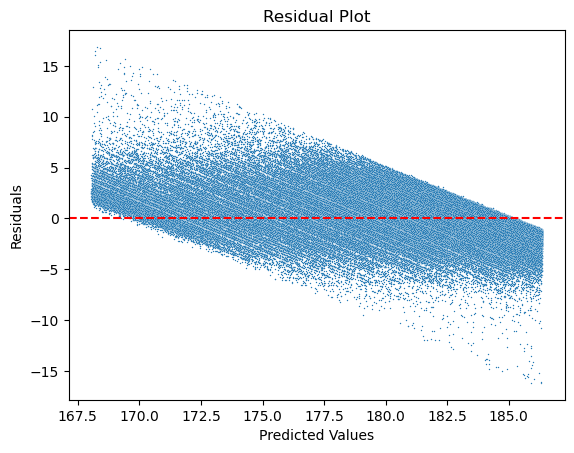

In [85]:
sns.scatterplot(data=pred_red_df, x='predicted_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

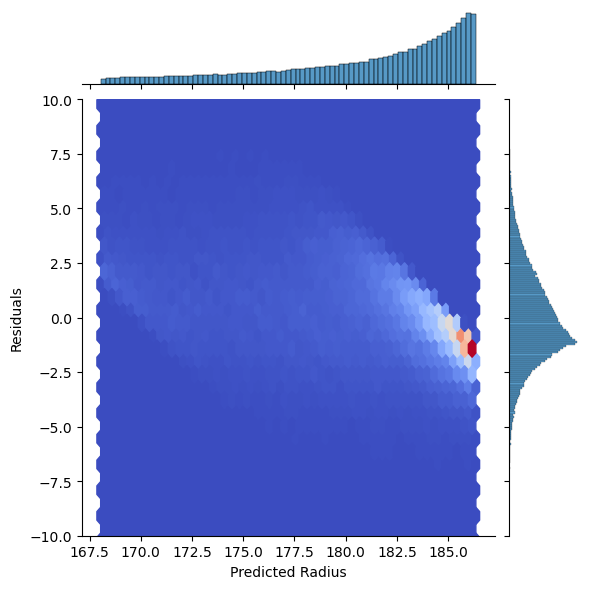

In [86]:
g = sns.jointplot(data=pred_red_df, x='predicted_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Predicted Radius')
plt.ylabel('Residuals')

### 4.6 Testing log transformation on the data with one `median_hit_radius` 

#### 4.6.1 Transforming both X_train and X_test

In [87]:
X_train_red_log = X_train_red.copy()
X_train_red_log = pd.DataFrame(X_train_red_log)
X_train_red_log['log_median'] = np.log10(X_train_red_log['median_hit_radius'])
X_train_red_log = X_train_red_log.drop(columns=['median_hit_radius'])
X_train_red_log

,log_median
381355,2.271760
18547,2.226118
309590,2.267305
479633,2.264389
410108,2.254756
...,...
259178,2.254385
365838,2.264832
131932,2.256999
671155,2.267728


In [88]:
X_test_red_log = X_test_red.copy()
X_test_red_log = pd.DataFrame(X_test_red_log)
X_test_red_log['log_median'] = np.log10(X_test_red_log['median_hit_radius'])
X_test_red_log = X_test_red_log.drop(columns=['median_hit_radius'])
X_test_red_log

,log_median
475764,2.264353
204175,2.245117
88108,2.239075
175421,2.254436
411120,2.266326
...,...
94973,2.251926
699276,2.269273
620224,2.269191
685067,2.274210


#### 4.6.2 Fitting the model

In [89]:
xgb_opt.fit(X_train_red_log, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 4.6.3 Scoring on the test set

In [90]:
xgb_opt.score(X_test_red_log, y_test)

0.7656358181969032

#### 4.6.4 Computing the residuals

In [91]:
ypred_red_log = xgb_opt.predict(X_test_red_log)


In [92]:
pred_red_log = pd.DataFrame(ypred_red_log, y_test).reset_index()
pred_red_log.columns=['predicted_radius', 'theoretical_radius']
pred_red_log['residual'] = pred_red_log['theoretical_radius'] - pred_red_log['predicted_radius']

Text(0, 0.5, 'Residuals')

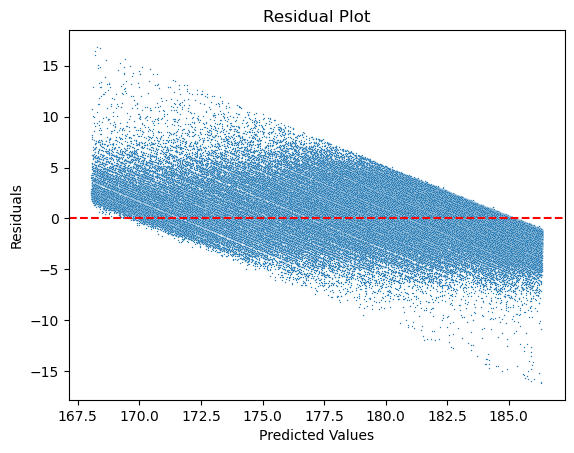

In [93]:
sns.scatterplot(data=pred_red_log, x='predicted_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

Text(17.625, 0.5, 'Residuals')

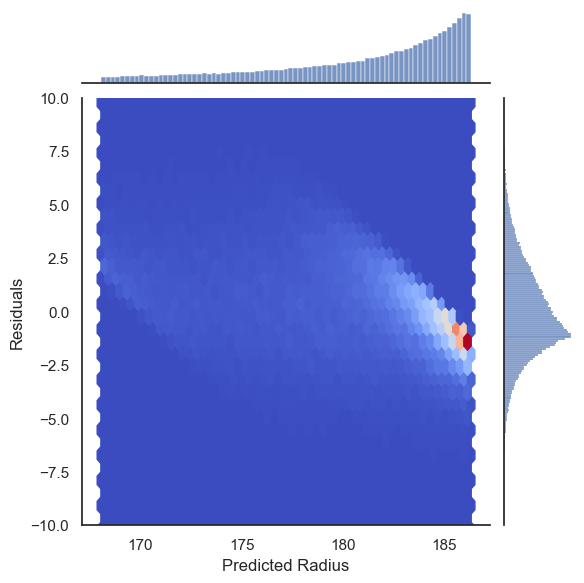

In [141]:
g = sns.jointplot(data=pred_red_log, x='predicted_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Predicted Radius')
plt.ylabel('Residuals')

### 4.7 Comparing the residual plot with ring radius calculated with SOTA 

#### 4.7.1 Data wrangling to include the SOTA radius into the dataset

In [95]:
sampled_data = pd.read_csv('../data/sampled_data.csv')

In [96]:
ring_radius_alg = sampled_data[['ring_radius']]

In [97]:
ring_radius_alg = grouped_hit_data.merge(ring_radius_alg, left_on='event', right_index=True)

#### 4.7.2 Computing the residuals

In [98]:
ring_radius_alg['residual'] = ring_radius_alg['ring_radius_cal'] - ring_radius_alg['ring_radius']

In [99]:
xgb_opt.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [100]:
ring_radius_alg['model_predicted_radius'] = xgb_opt.predict(ring_radius_alg.iloc[:, 1:20])

In [101]:
ring_radius_alg['residual_model'] = ring_radius_alg['ring_radius_cal'] - ring_radius_alg['model_predicted_radius']

#### Plotting residual from SOTA vs. residual from our model

/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_98867/1968060652.py:8: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  legend.legendHandles[0]._sizes = [100]
/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_98867/1968060652.py:9: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  legend.legendHandles[1]._sizes = [100]


Text(0, 0.5, 'Residuals')

/Users/Jialing/opt/miniconda3/envs/591/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/Jialing/opt/miniconda3/envs/591/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


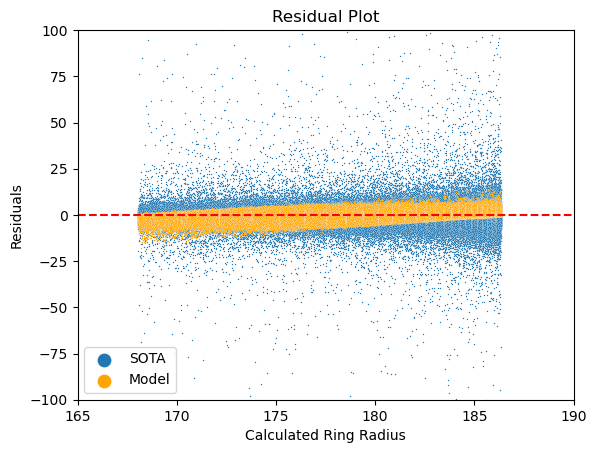

In [118]:
g = sns.scatterplot(data=ring_radius_alg, x='ring_radius_cal', y='residual', s=1, label='SOTA')
g = sns.scatterplot(data=ring_radius_alg, x='ring_radius_cal', y='residual_model', color = 'orange', s=1, label='Model')
plt.axhline(y=0, color='red', linestyle='--')
g.set(xlim = (165, 190))
g.set(ylim = (-100, 100))

legend = plt.legend()
legend.legendHandles[0]._sizes = [100]  
legend.legendHandles[1]._sizes = [100] 
plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.8 Plotting the `median_hit_radius` vs. calculated ring radius and momentum

#### 4.8.1 Plotting `median_hit_radius` vs. calculated ring radius

<Axes: xlabel='ring_radius_cal', ylabel='median_hit_radius'>

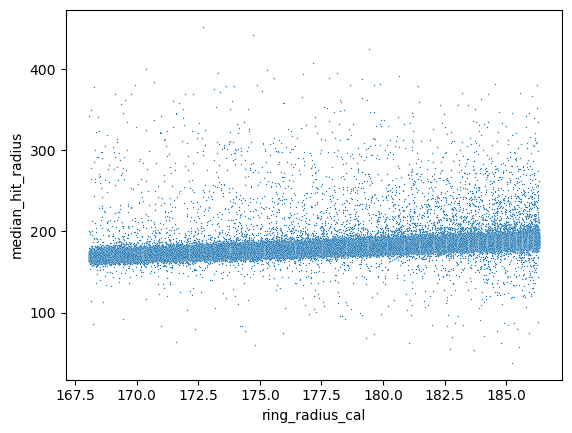

In [115]:
sns.scatterplot(data = grouped_hit_data, x = 'ring_radius_cal', y = 'median_hit_radius', s=1)

In [119]:
grouped_hit_data['median_hit_radius'].max()

452.1199045732838

Text(30.75, 0.5, 'Median hit radius')

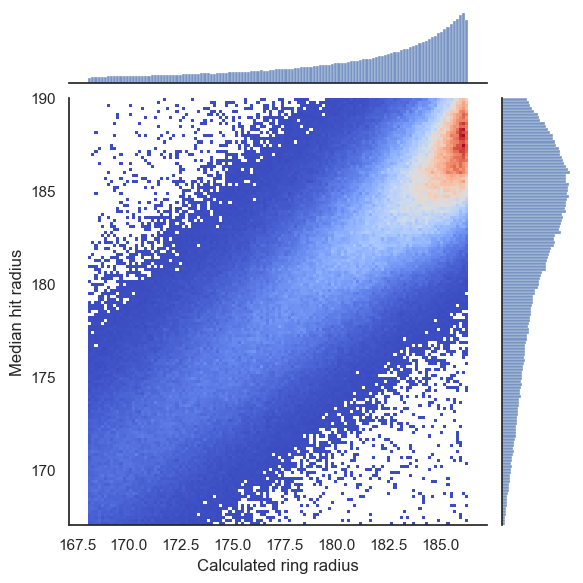

In [137]:
g = sns.jointplot(data = grouped_hit_data, x = 'ring_radius_cal', y = 'median_hit_radius', kind='hist', cmap='coolwarm', ylim=(167, 190))

plt.xlabel('Calculated ring radius')
plt.ylabel('Median hit radius')

#### 4.8.2 Plotting `median_hit_radius` vs. `track_momentum`
- The calculated (theoretical) ring radius is coloured in red 

<Axes: xlabel='track_momentum', ylabel='median_hit_radius'>

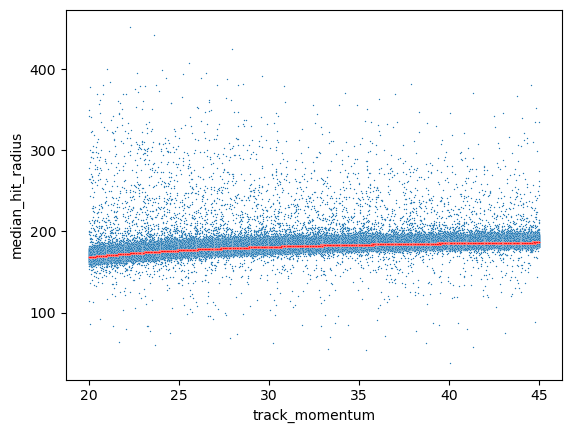

In [123]:
sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'median_hit_radius', s=1)
sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'ring_radius_cal', color = 'red', s=1)

#### 4.8.3 Plotting `median_hit_radius` vs. `track_momentum`
- The calculated (theoretical) ring radius is coloured in red

<Axes: xlabel='track_momentum', ylabel='median_hit_radius'>

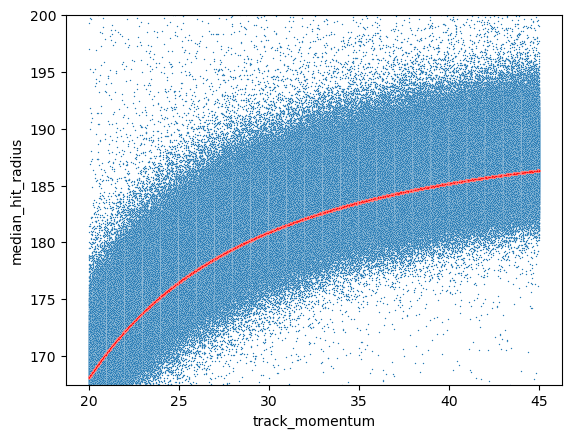

In [124]:
ploti = sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'median_hit_radius', s=1)
sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'ring_radius_cal', color = 'red', s=1)
ploti.set(ylim = (167.5, 200))
ploti

### 4.9 Fitting the model with all the features except `median_hit_radius`

#### 4.9.1 Subsetting the data

In [142]:
X_train_new = X_train.drop(columns=['median_hit_radius'])
X_test_new = X_test.drop(columns=['median_hit_radius'])

#### 4.9.2 Fitting the model with the same optimized hyperparameters 

In [143]:
xgb_opt.fit(X_train_new, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 4.9.3 Scoring on the test set

In [144]:
xgb_opt.score(X_test_new, y_test)

0.858534100699504

#### 4.9.4 Computing the residuals 

In [145]:
ypred_new = xgb_opt.predict(X_test_new)


In [146]:
pred_new = pd.DataFrame(ypred_new, y_test).reset_index()
pred_new.columns=['predicted_radius', 'theoretical_radius']
pred_new['residual'] = pred_new['theoretical_radius'] - pred_new['predicted_radius']

Text(0, 0.5, 'Residuals')

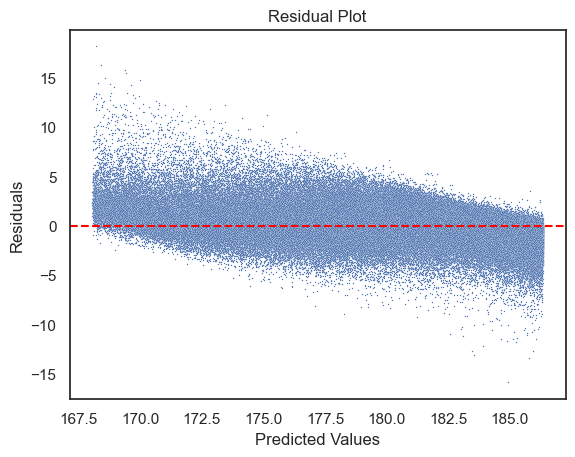

In [147]:
sns.scatterplot(data=pred_new, x='predicted_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

Text(17.625, 0.5, 'Residuals')

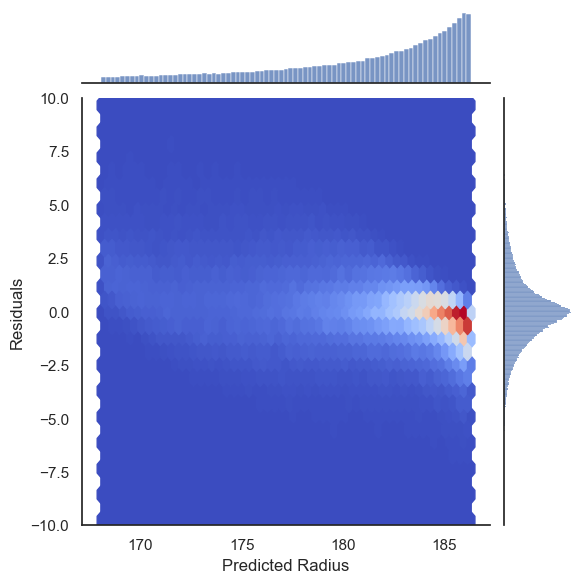

In [148]:
g = sns.jointplot(data=pred_new, x='predicted_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Predicted Radius')
plt.ylabel('Residuals')

### 4.10 Sanity check with `RandomForestRegressor` 

#### 4.10.1 Fitting the model

In [149]:
from sklearn.ensemble import RandomForestRegressor

In [150]:
rf = RandomForestRegressor()

In [151]:
rf.fit(X_train, y_train)

RandomForestRegressor()

#### 4.10.2 Scoring on the test set

In [152]:
rf.score(X_test, y_test)

0.8755017724560507

#### 4.10.3 Computing the residuals 

In [153]:
ypred_rf = rf.predict(X_test)


In [154]:
pred_rf_df = pd.DataFrame(ypred_rf, y_test).reset_index()
pred_rf_df.columns=['predicted_radius', 'theoretical_radius']
pred_rf_df['residual'] = pred_rf_df['theoretical_radius'] - pred_rf_df['predicted_radius']

Text(0, 0.5, 'Residuals')

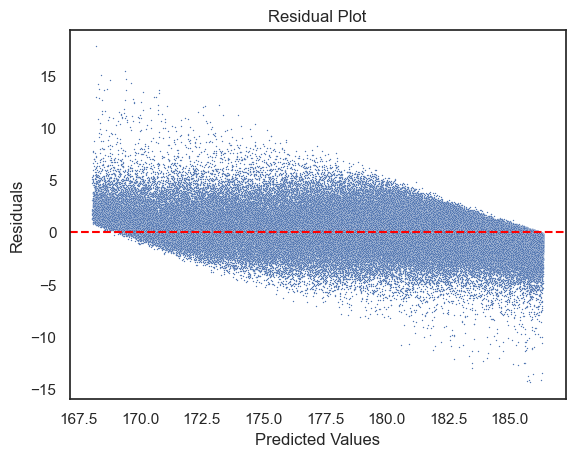

In [155]:
sns.scatterplot(data=pred_rf_df, x='predicted_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

Text(17.625, 0.5, 'Residuals')

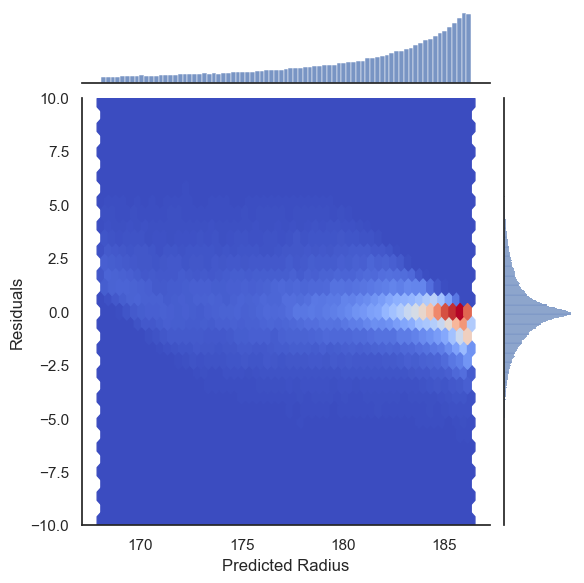

In [172]:
g = sns.jointplot(data=pred_rf_df, x='predicted_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Predicted Radius')
plt.ylabel('Residuals')

In [ ]:
# rf_cv = cross_validate(rf, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [ ]:
# pd.DataFrame(rf_cv)

### 4.11 `LightGBM`

#### 4.11.1 `LightGBM` with unscaled features 

In [156]:
from lightgbm.sklearn import LGBMRegressor

In [157]:
gbm = LGBMRegressor()

In [158]:
gbm.fit(X_train, y_train)

LGBMRegressor()

In [159]:
gbm_cv = cross_validate(gbm, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [160]:
pd.DataFrame(gbm_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,1.996006,0.192019,-1.803306,-1.791265,0.859590,0.862339
1,1.090295,0.183321,-1.791777,-1.793017,0.861144,0.862126
2,1.213059,0.181467,-1.800213,-1.789810,0.861628,0.862177
3,1.105450,0.162634,-1.804544,-1.788001,0.860820,0.862491
4,1.003027,0.180732,-1.813194,-1.789833,0.858855,0.862364


In [161]:
ypred_gbm = gbm.predict(X_test)


In [162]:
pred_gbm_df = pd.DataFrame(ypred_gbm, y_test).reset_index()
pred_gbm_df.columns=['predicted_radius', 'theoretical_radius']
pred_gbm_df['residual'] = pred_gbm_df['theoretical_radius'] - pred_gbm_df['predicted_radius']

Text(0, 0.5, 'Residuals')

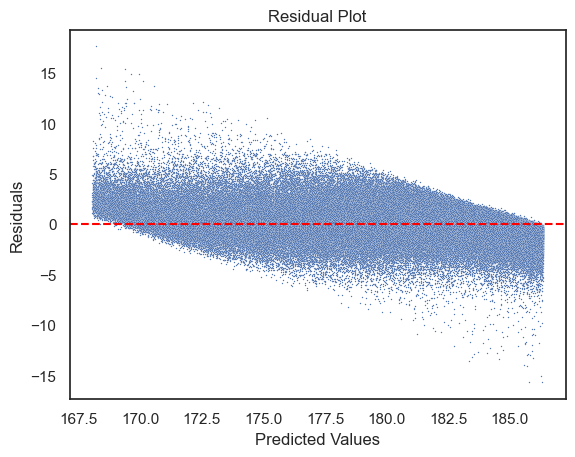

In [163]:
sns.scatterplot(data=pred_gbm_df, x='predicted_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

#### 4.11.2 `LightGBM` with scaled features

In [164]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline, make_pipeline

In [165]:
gbm_pipe = make_pipeline(StandardScaler(), LGBMRegressor())

In [166]:
gbm_pipe.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('lgbmregressor', LGBMRegressor())])

In [167]:
gbm_cv = cross_validate(gbm_pipe, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [168]:
pd.DataFrame(gbm_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,1.374350,0.199848,-1.802908,-1.791659,0.859652,0.862279
1,1.275754,0.184701,-1.790352,-1.792211,0.861365,0.862250
2,1.100141,0.165503,-1.801553,-1.791590,0.861422,0.861903
3,1.015479,0.153644,-1.805583,-1.789776,0.860659,0.862218
4,1.044420,0.153545,-1.812410,-1.788635,0.858977,0.862548


In [169]:
ypred_gbm_scaled = gbm_pipe.predict(X_test)


In [170]:
pred_gbm_scaled_df = pd.DataFrame(ypred_gbm_scaled, y_test).reset_index()
pred_gbm_scaled_df.columns=['predicted_radius', 'theoretical_radius']
pred_gbm_scaled_df['residual'] = pred_gbm_scaled_df['theoretical_radius'] - pred_gbm_scaled_df['predicted_radius']

Text(0, 0.5, 'Residuals')

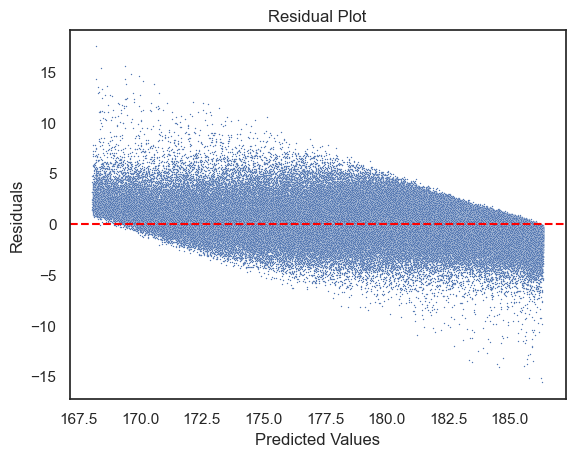

In [171]:
sns.scatterplot(data=pred_gbm_scaled_df, x='predicted_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

Text(17.625, 0.5, 'Residuals')

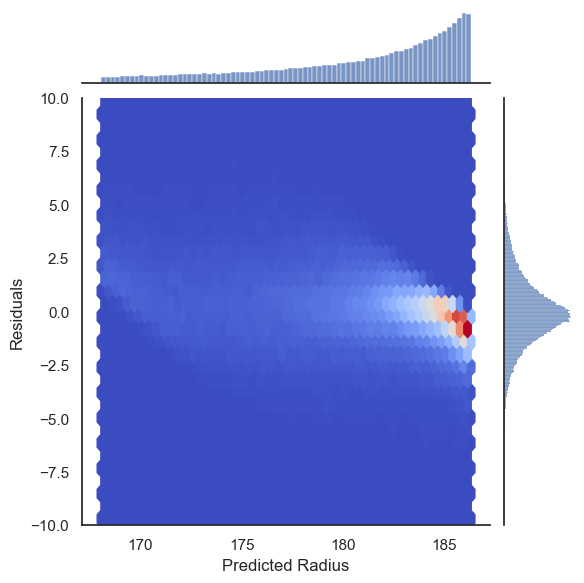

In [173]:
g = sns.jointplot(data=pred_gbm_scaled_df, x='predicted_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Predicted Radius')
plt.ylabel('Residuals')